# Examen Análisis de Datos en Meteorología
### Alumno: Víctor Galván Fraile
### Profesora: Belén Rodríguez de Fonseca
#### Curso: 2022-2023

In [1]:
#En primer lugar, vamos a importar todos los paquetes que vamos a usar a lo largo del examen
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import xarray as xr
import netCDF4 as nc
from scipy import stats as sts
import scipy.stats as stats
from scipy import signal
from scipy.fft import fft 
from statsmodels.tsa import stattools 
from cartopy import crs as ccrs # Cartography library
import cartopy as car
import cmocean as cmo #Oceanographic library for colormaps
import plotly as plty
import matplotlib.patches as mpatches
import cartopy.io.img_tiles as cimgt
import numpy.linalg as linalg
import numpy.ma as ma
from scipy.stats import pearsonr
import matplotlib.dates as mdates
from cartopy.util import add_cyclic_point #esto es para la banda de latitud que queda en blanco en 0ª
import matplotlib.dates as mdates
import cartopy.io.shapereader as shpreader

## 1. Ejercicio 1: Estadística Básica
En este ejercicio vamos a hacer un estudio estadístico de las temperaturas máximas de julio y y de la precipitación en el periodo 1960-2010. Usamos la base de datos Stead de temperaturas máximas (y mínimas) diarias

In [2]:
stead_path= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Examen final/Datos/tmax_pen.nc'
stead_file= xr.open_dataset(stead_path)
stead_file= stead_file.sel(Time=slice('1960','2010'))
stead_file

<xarray.Dataset>
Dimensions:  (lon: 230, lat: 190, Time: 18628)
Coordinates:
  * lon      (lon) float64 -9.673 -9.614 -9.556 -9.497 ... 3.607 3.665 3.724
  * lat      (lat) float64 44.17 44.12 44.08 44.03 ... 35.8 35.75 35.71 35.66
  * Time     (Time) datetime64[ns] 1960-01-01 1960-01-02 ... 2010-12-31
Data variables:
    tx       (Time, lat, lon) float32 ...
Attributes: (12/13)
    title:             Daily maximum temperature of peninsular Spain
    history:           version 1.0
    keywords:          daily, maximum temperature, peninsular Spain, Spain
    creator_name:      Roberto Serrano-Notivoli; Martin de Luis; Santiago Beg...
    maintainer_name:   Roberto Serrano-Notivoli
    maintainer_email:  rs@unizar.es
    ...                ...
    processing_level:  Quality-controlled. Final values.
    acknowledgment:    This study was supported by research projects financed...
    units:             Celsius degrees
    id:                STEAD
    sources:           AEMET and MAGRAMA
    naming_authority:  Spanish TEmperature At Daily scale

In [3]:
path_precip= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Tema 5/Datos ej clase/Spain02_v5.0_DD_010reg_aa3d_pr.nc'
precip= xr.open_dataset(path_precip)/10
precip_red= precip.sel(time=slice('1960','2010'))
precip_red= (precip_red.groupby('time.month')[7]).groupby('time.year').sum()
precip_red_mean= precip_red.mean(dim='year')
precip_red_std= precip_red.std(dim='year')
precip_red_referencia= precip_red.sel(year=slice('1981','2010'))

In [4]:
#seleccionamos el mes de Julio, que será con el que vamos a trabajar
maximas_julio= stead_file.groupby('Time.month')[7]

Vamos a representar en un mapa la temperatura media máxima de Julio para cada punto de malla así como su desviación estándar, aunque antes, vamos a calcular la temperatura máxima media de Julio para cada año. Debemos hacer esto ya que vamos a analizar el mes en su conjunto, no las temperaturas máximas diarias

In [5]:
maximas_julio_media_temporal= (maximas_julio.groupby('Time.year').mean()).mean(dim='year')
maximas_julio_std_temporal= (maximas_julio.groupby('Time.year').std()).mean(dim='year')

In [6]:
media_maximas_peninsula= stead_file.mean(dim=('lon','lat'))
media_maximas_meses= media_maximas_peninsula.groupby('Time.month')
media_maximas_meses

DatasetGroupBy, grouped over 'month'
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [7]:
dataframe= media_maximas_peninsula.to_dataframe()
dataframe['day'] = dataframe.index.day
dataframe['month'] = dataframe.index.month
dataframe['year'] = dataframe.index.year
dataframe['MONTH']= dataframe['month']-1 #for representation purposes
monthly_mean = dataframe.groupby(['month']).mean().reset_index()

mediaprecip_peninsula= precip.sel(time=slice('1960','2010')).mean(dim=('lon','lat'))
mediamediaprecip_peninsula= mediaprecip_peninsula.to_dataframe()
mediamediaprecip_peninsula['month'] = mediamediaprecip_peninsula.index.month
mediamediaprecip_peninsula['year'] = mediamediaprecip_peninsula.index.year
mediamediaprecip_peninsula= mediamediaprecip_peninsula.groupby(['year','month']).sum().reset_index()
mediamediaprecip_peninsula['MONTH']= mediamediaprecip_peninsula['month']-1 #for representation purposes
monthly_mean_precip = mediamediaprecip_peninsula.groupby(['month']).mean().reset_index()

In [8]:
def plotter_boxplots(data,x_axis_variable_name,y_axis_variable_name, xlabel,ylabel,title,labels_condition,ticks_labels, mean_line_condition,mean_data,x_variable_mean,mean_legend,nombre,paleta):
    fig,ax= plt.subplots()
    flierprops = dict(marker='o', markersize=5, markeredgecolor='black', markerfacecolor='green', alpha=0.5)
    sns.boxplot(x=x_axis_variable_name,y=y_axis_variable_name,data=data[[x_axis_variable_name,y_axis_variable_name]], palette=paleta,showfliers = True, flierprops=flierprops)
    #sns.violinplot(x=x_axis_variable_name,y=y_axis_variable_name,data=data[[x_axis_variable_name,y_axis_variable_name]], palette='YlOrBr',showfliers = True, flierprops=flierprops)
    plt.xlabel(xlabel, fontsize= 14, fontweight='bold')
    plt.ylabel(ylabel, fontsize= 14, fontweight='bold')
    plt.title(title, fontsize= 16, fontweight='bold')
    if mean_line_condition==True:
        sns.lineplot(x=x_variable_mean,y=y_axis_variable_name,data=mean_data[[x_variable_mean,y_axis_variable_name]],label=mean_legend,legend='auto')   
        plt.legend(loc='best')
    if labels_condition==True:
        plt.xticks(ticks=np.arange(len(ticks_labels)),labels=ticks_labels, fontsize= 12, fontweight='bold',rotation=25)
    plt.tight_layout()
    plt.savefig(nombre)
    plt.show()

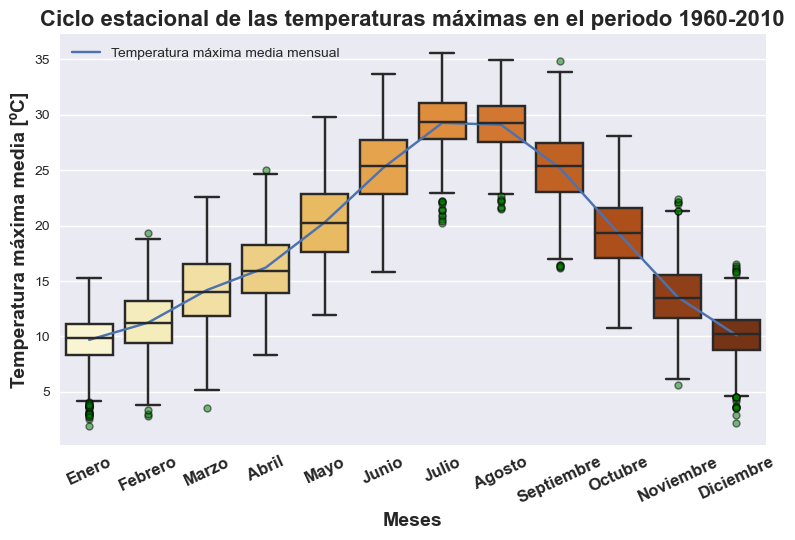

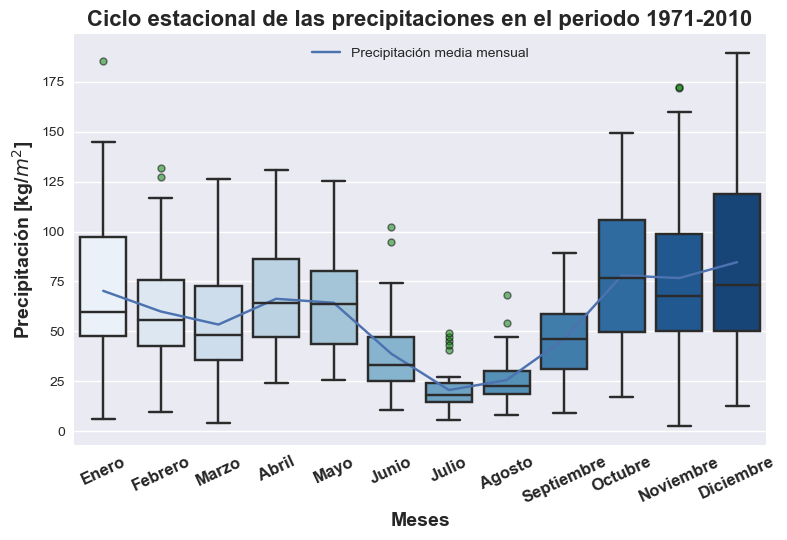

In [9]:
months= ['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre','Octubre','Noviembre','Diciembre']
plt.style.use('seaborn')
plotter_boxplots(dataframe,'month','tx','Meses','Temperatura máxima media [ºC]','Ciclo estacional de las temperaturas máximas en el periodo 1960-2010',True,months,True,monthly_mean,'MONTH','Temperatura máxima media mensual','ciclo estacional de temperaturas maximas.png','YlOrBr')
plotter_boxplots(mediamediaprecip_peninsula,'month','pr','Meses','Precipitación [kg/$m^2$]','Ciclo estacional de las precipitaciones en el periodo 1971-2010',True,months,True,monthly_mean_precip,'MONTH','Precipitación media mensual','ciclo estacional de precipitación.png','Blues')

In [10]:
def dibujo_1_mapa_cartopy(A,lon,lat,cmap1,l1,titulo, ax,levels,nombre):
    im=ax.contourf(lon,lat,A,cmap=cmap1,levels=levels,extend='both',transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=2)
    ax.set_title(titulo,fontsize=28)
    gl=ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax,label=l1)
    plt.tight_layout()
    fig.savefig(nombre)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xl

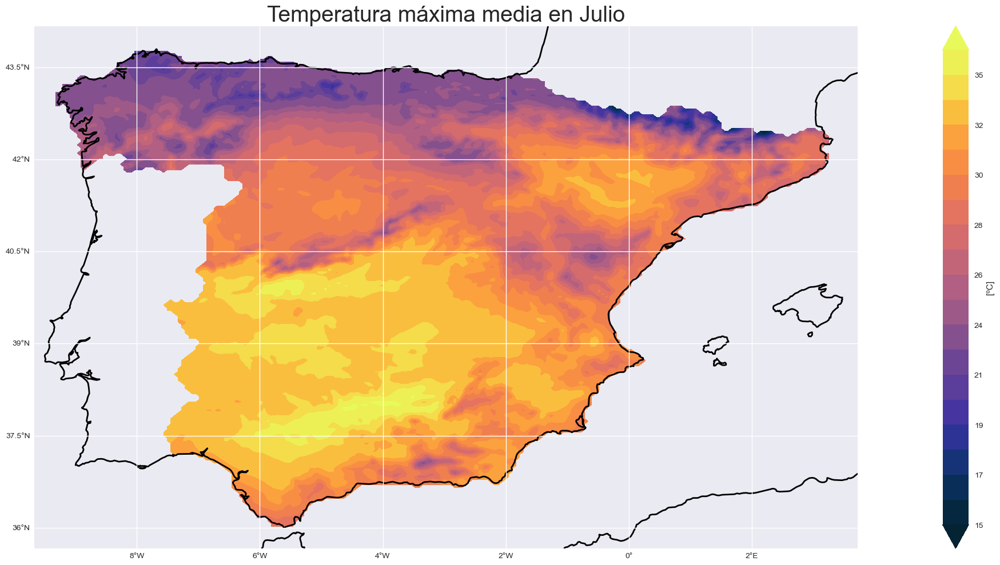

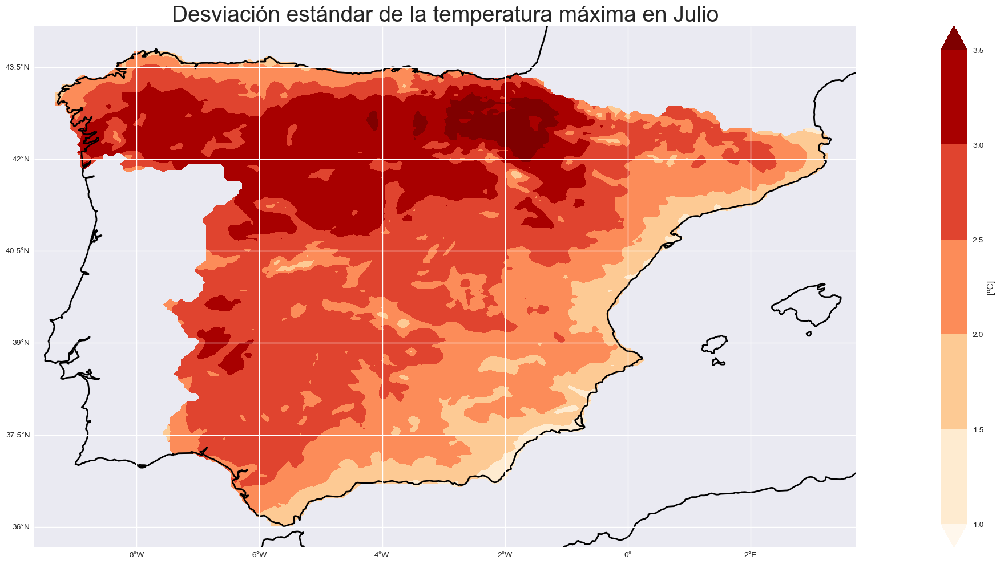

In [11]:
fig = plt.figure(figsize=(30,10)) 
ax1 = fig.add_subplot(111, projection=ccrs.PlateCarree())
nombre= 'temperatura_maxima.png'
levels1 = np.linspace(np.min(maximas_julio_media_temporal.tx),np.max(maximas_julio_media_temporal.tx),num=20).astype(int)
dibujo_1_mapa_cartopy(maximas_julio_media_temporal.tx,maximas_julio.lon,maximas_julio.lat,cmo.cm.thermal,'[ºC]','Temperatura máxima media en Julio', ax1,levels1,nombre)
fig = plt.figure(figsize=(30,10)) 
ax1 = fig.add_subplot(111, projection=ccrs.PlateCarree())
nombre= 'desviacion_estandar_de_maximas.png'
levels2 = np.arange(np.round(np.min(maximas_julio_std_temporal.tx),decimals=0),np.round(np.max(maximas_julio_std_temporal.tx),decimals=0),0.5)
dibujo_1_mapa_cartopy(maximas_julio_std_temporal.tx,maximas_julio.lon,maximas_julio.lat,'OrRd','[ºC]','Desviación estándar de la temperatura máxima en Julio', ax1,levels2,nombre)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


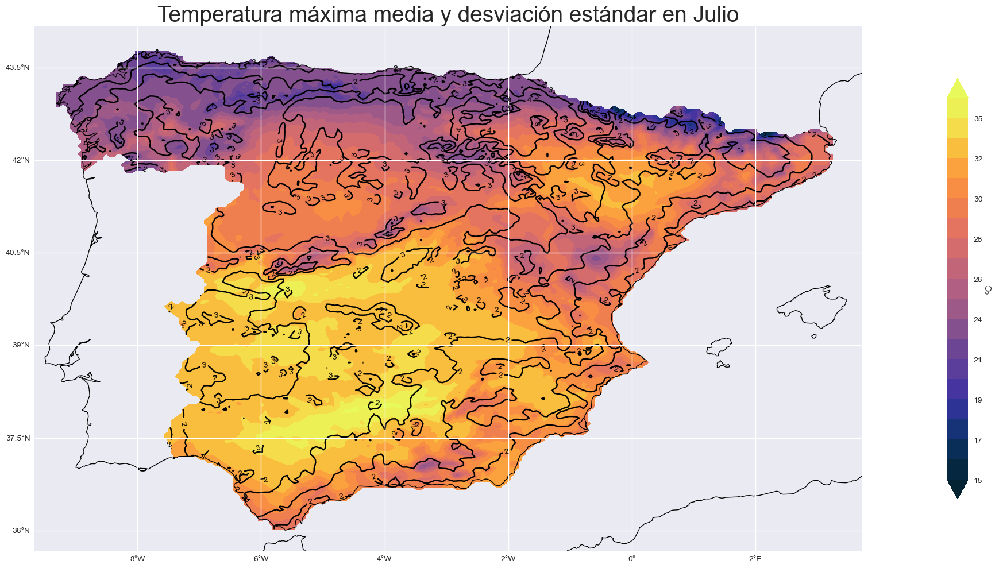

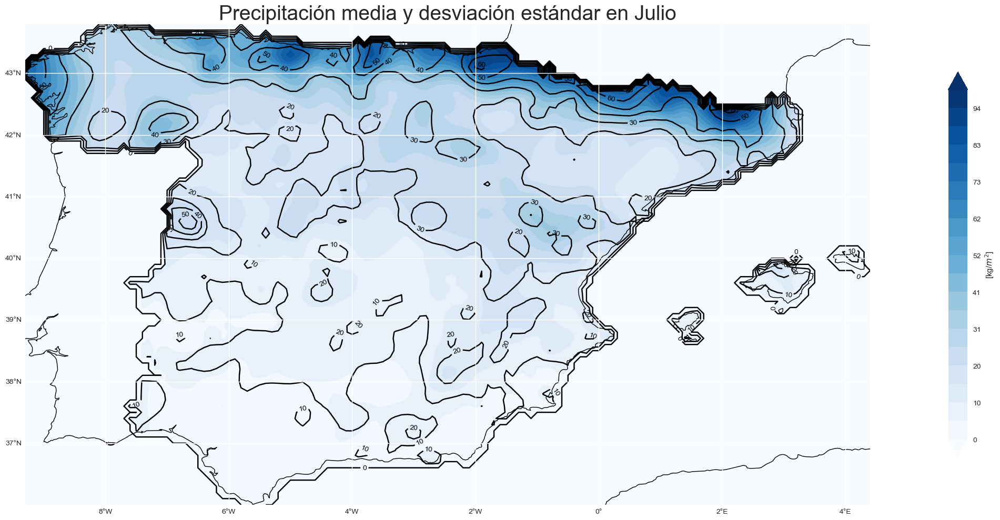

In [12]:
#vamos a crear ahora un mapa que sintetice la información de los dos anteriores
def DibujoMapaHorizontal(lon,lat,var1,var2,levels1,levels2, mapbar,unidades, titulo,ax,nombre):
    im=ax.contourf(lon,lat,var1,levels1,extend='both', cmap = mapbar)
    ax.coastlines(linewidth = 1)
    ax.set_title(titulo,fontsize=28)
    gl= ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax,shrink=0.8, label = unidades)
    im2=ax.contour(lon,lat,var2, colors='black')
    ax.clabel(im2, im2.levels, inline=True,fmt='%.0f', fontsize=10)
    plt.tight_layout()
    fig.savefig(nombre)
nombre='temp_max_media_y_desv_estandar.png'
fig = plt.figure(figsize=(30,10)) 
ax1 = fig.add_subplot(111, projection=ccrs.PlateCarree())
DibujoMapaHorizontal(maximas_julio.lon,maximas_julio.lat,maximas_julio_media_temporal.tx,maximas_julio_std_temporal.tx,levels1,levels2,cmo.cm.thermal,'ºC','Temperatura máxima media y desviación estándar en Julio',ax1,nombre)

nombre='precip_media_y_desv_estandar.png'
levels1_lluvia = np.linspace(np.min(precip_red_mean.pr),np.max(precip_red_mean.pr),num=20).astype(int)
levels2_lluvia = np.arange(np.min(precip_red_std.pr),np.max(precip_red_std.pr))
fig = plt.figure(figsize=(30,10)) 
ax1 = fig.add_subplot(111, projection=ccrs.PlateCarree())
DibujoMapaHorizontal(precip_red.lon,precip_red.lat,precip_red_mean.pr,precip_red_std.pr,levels1_lluvia,levels2_lluvia,'Blues','[kg/$m^2$]','Precipitación media y desviación estándar en Julio',ax1,nombre)

In [13]:
#en primer lugar, vamos a calcular y representar el mapa de percentil 90 de temperaturas máximas en cada lugar,
#de esta forma, vamos a ver cómo varía a lo largo de la península ibérica
cuantil10_julio= np.quantile(maximas_julio.groupby('Time.year').mean().tx,0.1,axis=0) #también trabajamos con temperaturas máximas medias mensuales
cuantil90_julio= np.quantile(maximas_julio.groupby('Time.year').mean().tx,0.9,axis=0)

cuantil10_julio_precip= np.quantile(precip_red.pr,0.1,axis=0) #también trabajamos con temperaturas máximas medias mensuales
cuantil90_julio_precip= np.quantile(precip_red.pr,0.9,axis=0)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


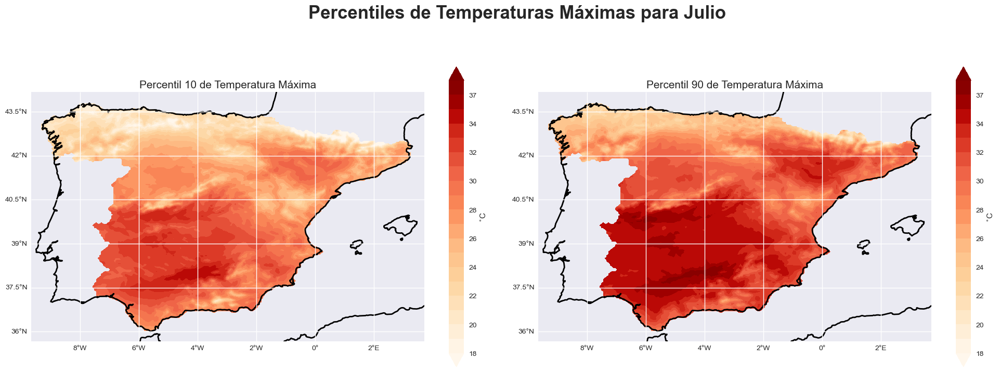

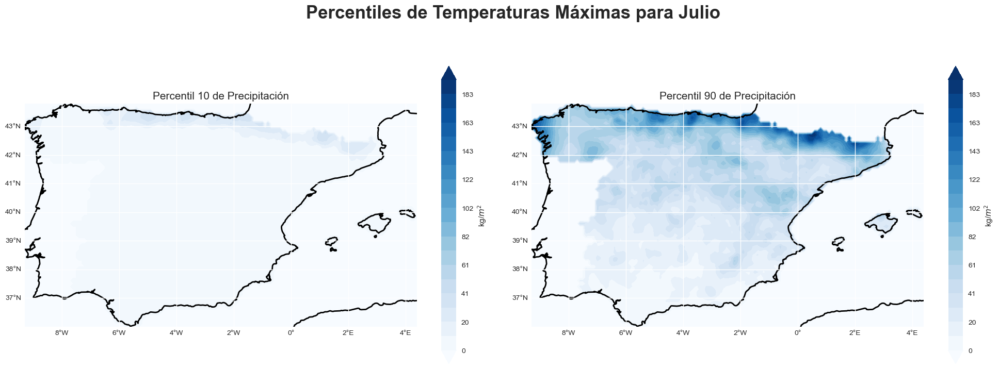

In [14]:
def DibujoMapados(lon,lat,var1,var2,mapbar,unidades,subtitulo1,subtitulo2,figura,mes):
    fig = plt.figure(figsize=(20,8) )
    ax1 = fig.add_subplot(121, projection=ccrs.PlateCarree())
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    fig.suptitle('Percentiles de Temperaturas Máximas para '+str(mes),fontsize=25, weight='bold')

    maximo1= np.max(np.abs((np.ma.masked_array(var1, np.isnan(var1)))))
    maximo2= np.max(np.abs((np.ma.masked_array(var2, np.isnan(var2)))))
    maximo= np.max((maximo1,maximo2))
    minimo1= np.min(np.abs((np.ma.masked_array(var1, np.isnan(var1)))))
    minimo2= np.min(np.abs((np.ma.masked_array(var2, np.isnan(var2)))))
    minimo= np.max((minimo1,minimo2))

    im=ax1.contourf(lon,lat,var1,levels=np.round(np.linspace(minimo,maximo,20),decimals=0), cmap = mapbar, extend='both')
    ax1.coastlines(linewidth = 2)
    gl=ax1.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax1,shrink=0.8, label = unidades,orientation='vertical')
    #im2=ax1.contour(lon,lat,var1,levels=np.linspace(minimo1,1.*maximo1,20), colors='gray')
    #ax1.clabel(im2, im2.levels,fmt='%.0f', inline=True, fontsize=10)
    #ax1.set_extent([-8,0,35.5,38.5]) #esto era la región sur, podemos poner los que queramos
    ax1.set_title(subtitulo1,fontsize=15)
        
    im3=ax2.contourf(lon,lat,var2,levels=np.round(np.linspace(minimo,maximo,20),decimals=0), cmap = mapbar, extend='both')
    ax2.coastlines(linewidth = 2)
    gl=ax2.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im3,ax=ax2,shrink=0.8, label = unidades,orientation='vertical')
    #im4=ax2.contour(lon,lat,var2,levels=np.linspace(minimo2,maximo2,5), colors='gray')
    #ax2.clabel(im4, im4.levels, fmt='%.0f', inline=True, fontsize=10)
    #ax2.set_extent([-8,0,35.5,38.5])
    ax2.set_title(subtitulo2,fontsize=15)
    plt.tight_layout()
    fig.savefig(figura)


lat= maximas_julio.lat
lon= maximas_julio.lon



mapbar='OrRd'
subtitulo1='Percentil 10 de Temperatura Máxima'
subtitulo2='Percentil 90 de Temperatura Máxima'
unidades='$^{\circ}$C'
figura='Percentil_temp_julio.png'
DibujoMapados(lon,lat,cuantil10_julio,cuantil90_julio,mapbar,unidades,subtitulo1,subtitulo2,figura,'Julio')

mapbar='Blues'
subtitulo1='Percentil 10 de Precipitación'
subtitulo2='Percentil 90 de Precipitación'
unidades='kg/$m^2$'
figura='Percentil_precip_julio.png'
DibujoMapados(precip_red.lon,precip_red.lat,cuantil10_julio_precip,cuantil90_julio_precip,mapbar,unidades,subtitulo1,subtitulo2,figura,'Julio')

In [15]:
#vemos como el centro-sur peninsular parece tener un comportamiento bastante parecido, y el norte tb parece tener el suyo
#vamos por ello a tomar como primera aproximación la media de la temperatura máxima para cada día en toda la península
maximas_julio_media= maximas_julio.mean(dim=('lon','lat')) #ahora lo que tenemos es UNA serie temporal

In [16]:
#Adicionalmente, vamos a dividir a España en Norte y Sur
Norte_latitudes= [44.17,40.5]
Sur_latitudes= [40.5,35.66]
maximas_julio_norte= (maximas_julio.sel(lat=slice(Norte_latitudes[0],Norte_latitudes[1]))).mean(dim=('lon','lat'))
maximas_julio_sur= (maximas_julio.sel(lat=slice(Sur_latitudes[0],Sur_latitudes[1]))).mean(dim=('lon','lat'))

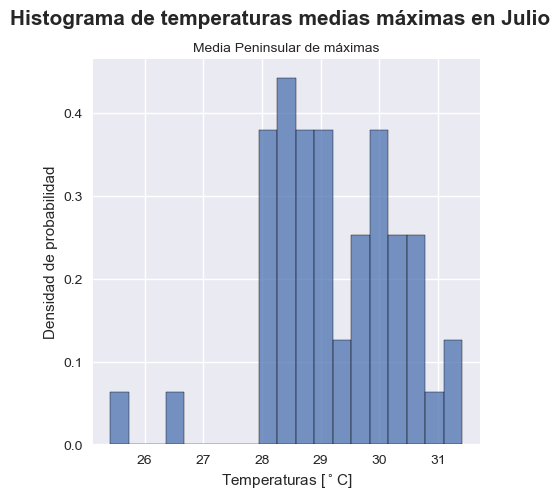

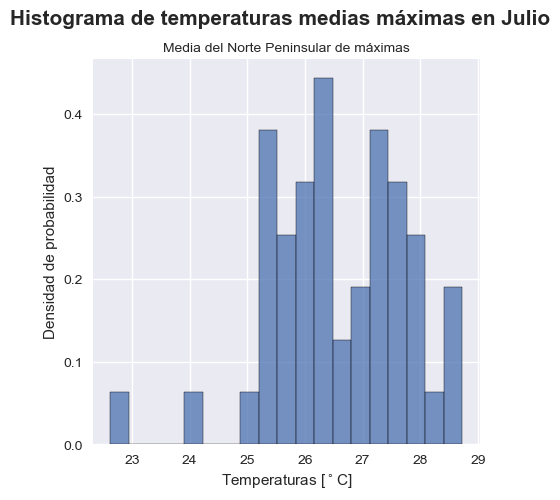

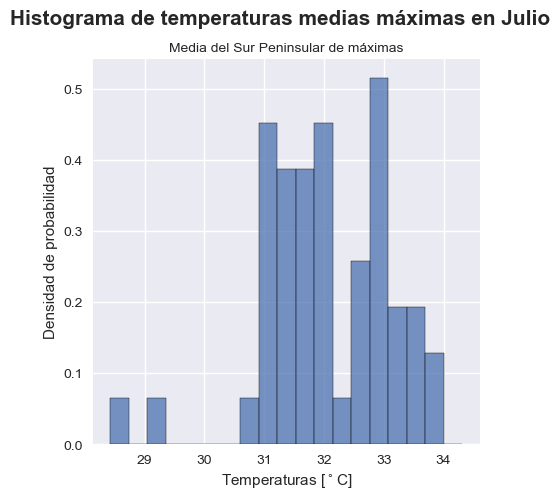

In [17]:
#ahora pasamos de datos diarios a mensuales haciendo la media para cada julio de cada año
maximas_julio_media_mensual= maximas_julio_media.groupby('Time.year').mean()
#para norte y sur
maximas_julio_media_mensual_norte= maximas_julio_norte.groupby('Time.year').mean()
maximas_julio_media_mensual_sur= maximas_julio_sur.groupby('Time.year').mean()

#y la representamos en forma de un histograma
def histogram_plotter(data,title,subtitle):
    bins= np.arange(np.min(data),np.max(data),step=(np.max(data)-np.min(data))/20)
    fig,ax= plt.subplots(figsize=(5,5))
    sns.histplot(data,bins=bins,kde = False, stat='density')
    fig.suptitle(title,fontsize=15, weight='bold')
    ax.set_title(subtitle,fontsize=10)
    ax.set_xlabel('Temperaturas [$^\circ$C]')
    ax.set_ylabel('Densidad de probabilidad')
plt.style.use('seaborn')
titulo= 'Histograma de temperaturas medias máximas en Julio'
subtitulo='Media Peninsular de máximas'
subtitulo_norte='Media del Norte Peninsular de máximas'
subtitulo_sur='Media del Sur Peninsular de máximas'

histogram_plotter(maximas_julio_media_mensual.tx,titulo,subtitulo)
histogram_plotter(maximas_julio_media_mensual_norte.tx,titulo,subtitulo_norte)
histogram_plotter(maximas_julio_media_mensual_sur.tx,titulo,subtitulo_sur)


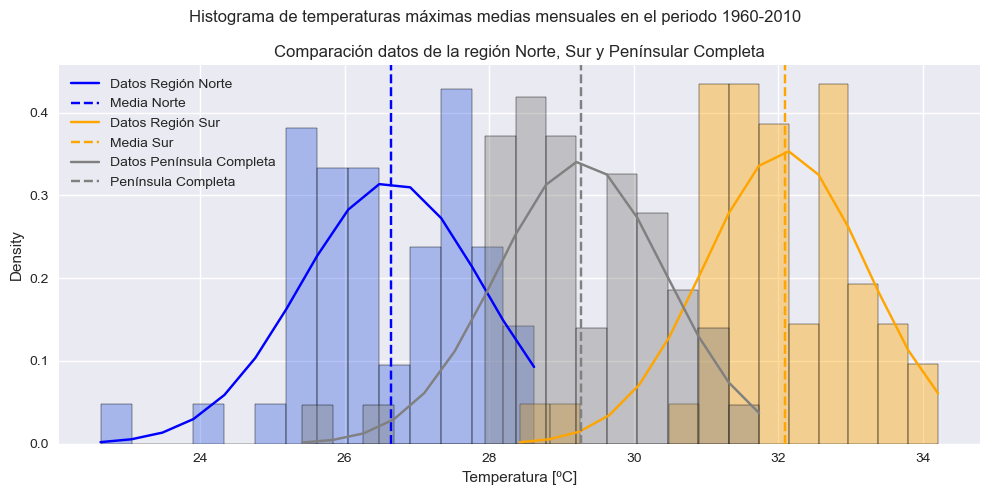

In [18]:
mean_norte= np.mean(maximas_julio_media_mensual_norte.tx)
std_norte= np.std(maximas_julio_media_mensual_norte.tx)
n_norte= np.shape(maximas_julio_media_mensual_norte.tx)[0]
bins_norte= np.arange(np.min(maximas_julio_media_mensual_norte.tx),np.max(maximas_julio_media_mensual_norte.tx),step=(np.max(maximas_julio_media_mensual_norte.tx)-np.min(maximas_julio_media_mensual_norte.tx))/15)
fig,ax= plt.subplots(figsize=(10,5))
sns.histplot(maximas_julio_media_mensual_norte.tx,bins=bins_norte,stat='density',alpha=0.4,color='royalblue')
normal_distribution_norte= stats.norm.pdf(bins_norte,mean_norte,std_norte)
plt.plot(bins_norte,normal_distribution_norte,'blue',label='Datos Región Norte')
alfa=0.05
plt.axvline(x= mean_norte,color='blue',label='Media Norte',linestyle='--')

mean_sur= np.mean(maximas_julio_media_mensual_sur.tx)
std_sur= np.std(maximas_julio_media_mensual_sur.tx)
n_sur= np.shape(maximas_julio_media_mensual_sur.tx)[0]
bins_sur= np.arange(np.min(maximas_julio_media_mensual_sur.tx),np.max(maximas_julio_media_mensual_sur.tx),step=(np.max(maximas_julio_media_mensual_sur.tx)-np.min(maximas_julio_media_mensual_sur.tx))/15)
sns.histplot(maximas_julio_media_mensual_sur.tx,bins=bins_sur,stat='density',alpha=0.4,color='orange')
normal_distribution_sur= stats.norm.pdf(bins_sur,mean_sur,std_sur)
plt.plot(bins_sur,normal_distribution_sur,'orange',label='Datos Región Sur')
plt.axvline(x= mean_sur,color='orange',label='Media Sur',linestyle='--')

mean= np.mean(maximas_julio_media_mensual.tx)
std= np.std(maximas_julio_media_mensual.tx)
n= np.shape(maximas_julio_media_mensual.tx)[0]
bins= np.arange(np.min(maximas_julio_media_mensual.tx),np.max(maximas_julio_media_mensual.tx),step=(np.max(maximas_julio_media_mensual.tx)-np.min(maximas_julio_media_mensual.tx))/15)
sns.histplot(maximas_julio_media_mensual.tx,bins=bins,stat='density',alpha=0.4,color='grey')
normal_distribution= stats.norm.pdf(bins,mean,std)
plt.plot(bins,normal_distribution,'grey',label='Datos Península Completa')
plt.axvline(x= mean,color='grey',label='Península Completa',linestyle='--')


plt.legend(loc='best')
plt.xlabel('Temperatura [ºC]')
plt.title('Comparación datos de la región Norte, Sur y Penínsular Completa')
plt.suptitle('Histograma de temperaturas máximas medias mensuales en el periodo 1960-2010')
plt.tight_layout()
plt.savefig('Histograma de temperaturas maximas medias mensuales en tres regiones.png')
plt.show()

## Veamos los percentiles e índices de confianza

In [19]:
print('NORTE')
quantile_data_norte= np.quantile(maximas_julio_media_mensual_norte.tx,(0.05,0.95))
quantile_theoric_norte= [stats.norm.ppf(0.05,mean_norte,std_norte),stats.norm.ppf(0.95,mean_norte,std_norte)]
print('Percentiles for the data are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_data_norte[0],quantile_data_norte[1]))
print('Percentiles for the theoric distribution are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_theoric_norte[0],quantile_theoric_norte[1]))
print('Índice de Confianza del 95%')
alfa=0.05
#We must use the t-student distribution, beacuse we don't now the standard deviation of the data
t_alpha_2= stats.t.ppf(1-alfa/2,n-1)
ic_norte= t_alpha_2*std_norte/np.sqrt(n_norte)
print('IC= [%.2f+-%.2f] (ºC)'%(mean_norte,ic_norte))
print('With scipy function:')
ic_scipy=stats.t.interval(alpha=0.95,df=n_norte-1,loc=mean_norte,scale= std_norte/np.sqrt(n_norte))
print(ic_scipy)
print('------------------')

print('SUR')
quantile_data_sur= np.quantile(maximas_julio_media_mensual_sur.tx,(0.05,0.95))
quantile_theoric_sur= [stats.norm.ppf(0.05,mean_sur,std_sur),stats.norm.ppf(0.95,mean_sur,std_sur)]
print('Percentiles for the data are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_data_sur[0],quantile_data_sur[1]))
print('Percentiles for the theoric distribution are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_theoric_sur[0],quantile_theoric_sur[1]))
print('Índice de Confianza del 95%')
alfa=0.05
#We must use the t-student distribution, beacuse we don't now the standard deviation of the data
t_alpha_2= stats.t.ppf(1-alfa/2,n_sur-1)
ic_sur= t_alpha_2*std_sur/np.sqrt(n_sur)
print('IC= [%.2f+-%.2f] (ºC)'%(mean_sur,ic_sur))
print('With scipy function:')
ic_scipy=stats.t.interval(alpha=0.95,df=n_sur-1,loc=mean_sur,scale= std_sur/np.sqrt(n_sur))
print(ic_scipy)
print('-----------------')

print('PENÍNSULA COMPLETA')
quantile_data= np.quantile(maximas_julio_media_mensual.tx,(0.05,0.95))
quantile_theoric= [stats.norm.ppf(0.05,mean,std),stats.norm.ppf(0.95,mean,std)]
print('Percentiles for the data are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_data[0],quantile_data[1]))
print('Percentiles for the theoric distribution are: q(5%%)=%.2f and q(95%%)= %.2f' %(quantile_theoric[0],quantile_theoric[1]))
print('Índice de Confianza del 95%')
alfa=0.05
#We must use the t-student distribution, beacuse we don't now the standard deviation of the data
t_alpha_2= stats.t.ppf(1-alfa/2,n-1)
ic= t_alpha_2*std/np.sqrt(n)
print('IC= [%.2f+-%.2f] (ºC)'%(mean,ic))
print('With scipy function:')
ic_scipy=stats.t.interval(alpha=0.95,df=n-1,loc=mean,scale= std/np.sqrt(n))
print(ic_scipy)

NORTE
Percentiles for the data are: q(5%)=25.10 and q(95%)= 28.50
Percentiles for the theoric distribution are: q(5%)=24.57 and q(95%)= 28.72
Índice de Confianza del 95%
IC= [26.65+-0.35] (ºC)
With scipy function:
(26.291317010435687, 27.000377630677594)
------------------
SUR
Percentiles for the data are: q(5%)=30.82 and q(95%)= 33.75
Percentiles for the theoric distribution are: q(5%)=30.24 and q(95%)= 33.95
Índice de Confianza del 95%
IC= [32.10+-0.32] (ºC)
With scipy function:
(31.77796842761627, 32.41254518322358)
-----------------
PENÍNSULA COMPLETA
Percentiles for the data are: q(5%)=27.99 and q(95%)= 31.10
Percentiles for the theoric distribution are: q(5%)=27.34 and q(95%)= 31.19
Índice de Confianza del 95%
IC= [29.27+-0.33] (ºC)
With scipy function:
(28.94044040978383, 29.598774678106796)


Una vez hemos visto y analizado el comportamiento normal del mes de Julio, dividiéndolo por regiones, vamos a ver cómo fue Julio de 2022, para ello, vamos a tomar los datos obtenidos en el informe de la AEMET sobre mes
Tomaremos de la base STEAD el promedio de las máximas medias mensuales en el periodo de estudio en toda la España Peninsular (representado en gris en el histograma anterior). En el informe de la AEMET se dice que: "Las temperaturas máximas diarias quedaron en promedio 3.3 °C por encima del valor normal"

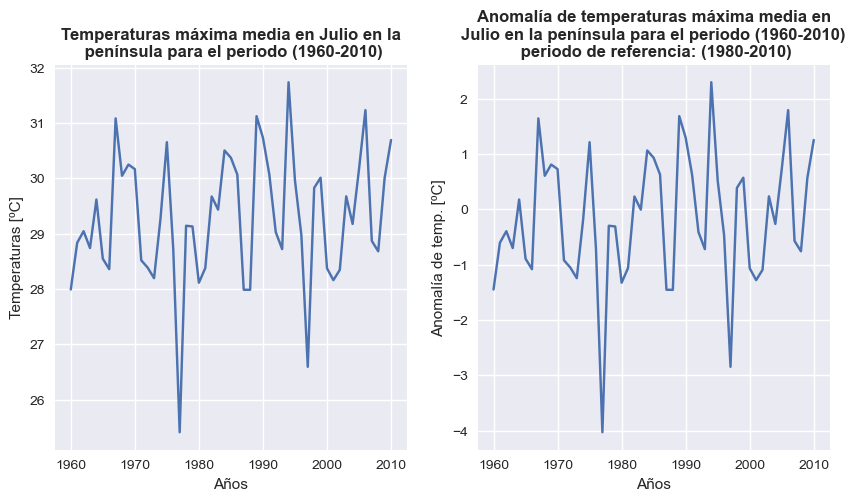

In [20]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
ax1.plot(maximas_julio_media_mensual.year,maximas_julio_media_mensual.tx)
ax1.set_xlabel('Años')
ax1.set_ylabel('Temperaturas [ºC]')
ax1.set_title('Temperaturas máxima media en Julio en la\n península para el periodo (1960-2010)',fontsize=12, weight='bold')

#tomamos el periodo de referencia de la aemet, para ser consistentes, esto es 1980-2010
temp_max_media_periododereferencia= (maximas_julio_media_mensual.sel(year=slice('1980','2010'))).mean()

ax2.plot(maximas_julio_media_mensual.year,maximas_julio_media_mensual.tx-temp_max_media_periododereferencia.tx)
ax2.set_xlabel('Años')
ax2.set_ylabel('Anomalía de temp. [ºC]')
ax2.set_title('Anomalía de temperaturas máxima media en\nJulio en la península para el periodo (1960-2010)\n periodo de referencia: (1980-2010)',fontsize=12, weight='bold')
fig.savefig('temperatura maxima media y anomalia por cada año.png')

Vamos ahora, tomando el periodo de referencia de la AEMET, a hacer los histogramas de las anomalías de temperaturas máximas medias mensuales. Concretamente, el informe de la AEMET que la anomalía de temperaturas máximas en Julio de 2022 fue de  3.3 °C por encima del valor normal

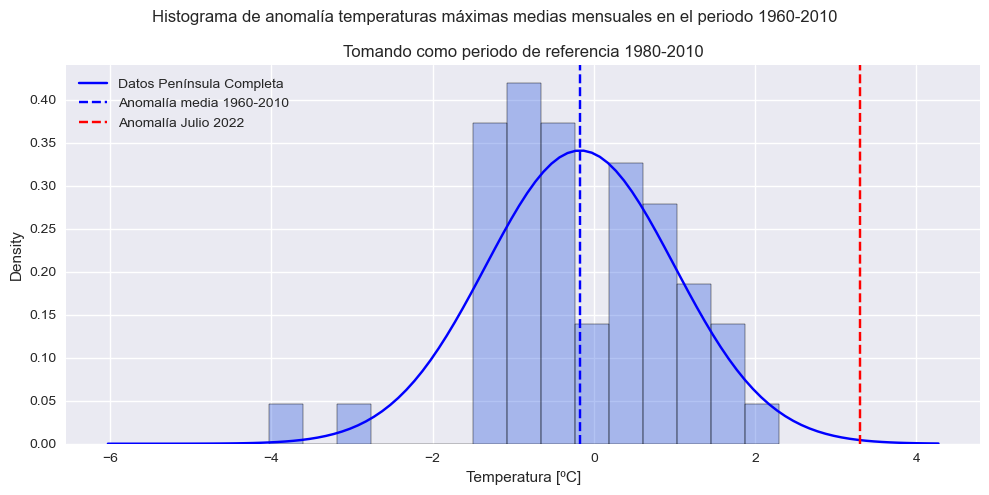

In [21]:
anomalia_julio22_aemet= 3.3
anomalias= maximas_julio_media_mensual.tx - temp_max_media_periododereferencia.tx

mean= np.mean(anomalias)
std= np.std(anomalias)
n= np.shape(anomalias)[0]
bins= np.arange(np.min(anomalias),np.max(anomalias),step=(np.max(anomalias)-np.min(anomalias))/15)
bins2= np.arange(np.min(anomalias)-2,np.max(anomalias)+2,0.1)
fig,ax= plt.subplots(figsize=(10,5))
sns.histplot(anomalias,bins=bins,stat='density',alpha=0.4,color='royalblue')
normal_distribution= stats.norm.pdf(bins2,mean,std)
plt.plot(bins2,normal_distribution,'blue',label='Datos Península Completa')
plt.axvline(x= mean,color='blue',label='Anomalía media 1960-2010',linestyle='--')
plt.axvline(x= anomalia_julio22_aemet,color='red',label='Anomalía Julio 2022',linestyle='--')


plt.legend(loc='best')
plt.xlabel('Temperatura [ºC]')
plt.title('Tomando como periodo de referencia 1980-2010')
plt.suptitle('Histograma de anomalía temperaturas máximas medias mensuales en el periodo 1960-2010')
plt.tight_layout()
plt.savefig('Histograma de anomalias de temperaturas maximas con anomalia de 2022.png')
plt.show()

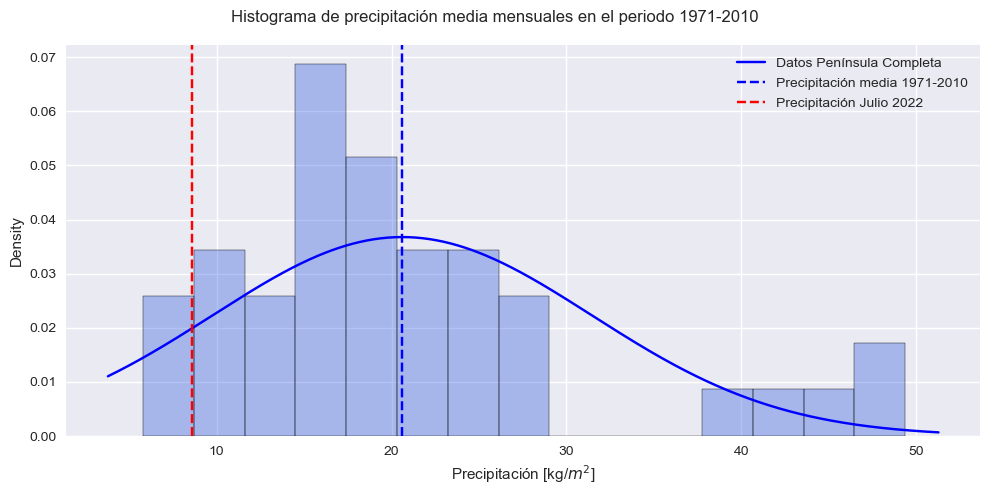

In [22]:
precip_julio22_aemet= 8.6
precip_red= precip.sel(time=slice('1960','2010'))
precip_red= (precip_red.groupby('time.month')[7]).mean(dim=('lat','lon')).groupby('time.year').sum()
precip_base_de_datos= precip_red.pr
mean= np.nanmean(precip_base_de_datos)
std= np.std(precip_base_de_datos)
n= np.shape(precip_base_de_datos)[0]
bins= np.arange(np.min(precip_base_de_datos),np.max(precip_base_de_datos),step=(np.max(precip_base_de_datos)-np.min(precip_base_de_datos))/15)
bins2= np.arange(np.min(precip_base_de_datos)-2,np.max(precip_base_de_datos)+2,0.1)
fig,ax= plt.subplots(figsize=(10,5))
sns.histplot(precip_base_de_datos,bins=bins,stat='density',alpha=0.4,color='royalblue')
normal_distribution= stats.norm.pdf(bins2,mean,std)
plt.plot(bins2,normal_distribution,'blue',label='Datos Península Completa')
plt.axvline(x= mean,color='blue',label='Precipitación media 1971-2010',linestyle='--')
plt.axvline(x= precip_julio22_aemet,color='red',label='Precipitación Julio 2022',linestyle='--')


plt.legend(loc='best')
plt.xlabel('Precipitación [kg/$m^2$]')
plt.suptitle('Histograma de precipitación media mensuales en el periodo 1971-2010')
plt.tight_layout()
plt.savefig('Histograma de precipitación media mensuales en el periodo 1970-2010.png')
plt.show()

In [23]:
anomalia_mensual= anomalias
media_periodocompletomensual= anomalia_mensual.mean()
varianza= (anomalias.std())**2 #elevamos al cuadrado para calcular la varianza a partir de la desv estándar

Una vez tenemos la media y la varianza de nuestra serie, procedemos a calcular sus intervalos de confianza
#### I. Media
Como desconocemos la varianza de población, utilizamos la muestral. Además, como la muestra es grande (n>30), usamos la varianza muestral y aproximamos la distribución T-Student por una Normal. Esto es, que el intervalo de confianza vendrá dado por:
>$IC=[\overline{X}\pm z_{\alpha/2}\frac{\sigma}{\sqrt{n}}]$

In [24]:
alfa=0.05
n = len(anomalia_mensual)
media= media_periodocompletomensual
sigma= np.sqrt(varianza)
z_alpha_2= sts.norm.ppf(1-alfa/2)
ic = z_alpha_2*sigma/np.sqrt(n)
print('Índice de Confianza del 95 %')
print('IC= [%.2f+-%.2f] (ºC)'%(media,ic))
print('Con la función de scipy:')
ic_scipy=sts.norm.interval(alpha=0.95,loc=media,scale= sigma/np.sqrt(n))
print(ic_scipy)

Índice de Confianza del 95 %
IC= [-0.17+-0.32] (ºC)
Con la función de scipy:
(-0.4920663907012369, 0.1503400577983286)


#### II. Varianza

El IC para la varianza de la población $\sigma^2$, para lo que utilizaremos la varianza muestral $\boldsymbol S^2$
Recordemos que si la población de origen está distribuida como una normal $N(\mu,\sigma)$ el intervalo de confianza se puede calcular como   
>$IC=\left ( \frac{(n-1)\boldsymbol S^2}{\chi^2_{\alpha/2,n-1}},\frac{(n-1)\boldsymbol S^2}{\chi^2_{1-\alpha/2,n-1}}\right )$


In [25]:
alfa = 0.05

chi2_alpha_2 = stats.chi2.ppf(1-alfa/2,n-1)
chi2_1_alpha_2 = stats.chi2.ppf(alfa/2,n-1)

#ic1 = (n-1)*np.var(anomalia_mensual,ddof=1)/chi2_alpha_2
ic1 = (n-1)*varianza/chi2_alpha_2
ic2 = (n-1)*varianza/chi2_1_alpha_2

print('Varianza de la muestra: %.2f'%varianza)
print('Índice de Confianza del 95 %')
print('IC= [%.2f,%.2f] (ºC)'%(ic1,ic2))

Varianza de la muestra: 1.37
Índice de Confianza del 95 %
IC= [0.96,2.12] (ºC)


#### III. Otros Momentos Centrales

In [26]:
#Podemos calcular también otros momentos centrales, como asimetría y curtosis de nuestra muestra
print('La asimetría es ',stats.skew(anomalia_mensual))
print('La curtosis es ',stats.kurtosis(anomalia_mensual))

La asimetría es  -0.4919596677274301
La curtosis es  1.0123596535104458


Por último vamos a ver si el Julio de 2022 fue significativamente diferente al resto. Del informe de la AEMET vimo que la anomalía de las máximas diarias fue de +3.3 [ºC] respecto de la media en el periodo de referencia (1980-2010). Haremos para ello lo siguiente: tomamos $\mu_o$ como la anomalía de 2022, y vamos a aplicar un contraste de hipótesis:
* PASOS:
1. Formulamos la hipótesis nula, $H_0$, que es la que buscamos recharzar, y es decir que la media de la población (1960-2010) ($\mu$) es igual a la de 2022 ($\mu_0$), con lo cual: $H_0$: $\mu = \mu_0$ y $H_1$: $\mu \neq \mu_0$.
2. Atendiendo a la teoría, vemos que cuando el contraste de hipótesis concierne a un parámetro particular, los intervalos de confianza pueden usarse para evaluar si se rechaza o no $H_0$. De esta manera, teniendo en cuenta el intervalo de confianza que hemos calculado para la media: $\mu_0$=+3.33 $\notin$ [-0.17$\pm$ 0.32] [ºC].
3. Rechazamos $H_0$, con lo cual, podemos afirmar que el Julio de 2022 sí que fue significativamente diferente al resto


### Ejercicio 2: Análisis Univariante
En este segundo ejercicio vamos a calcular un índice que sea representativo del patrón de anomalías de SLP que coincidió con la ola de calor de Julio de 2022. Una vez con este índice, haremos un análisis de la serie temporal

In [27]:
path_slp_julio22= 'C:/Users/ideapad 5 15ITL05/Desktop//Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Examen final/Datos/SLP_anom_24Julio2022.nc'
slp_julio22= xr.open_dataset(path_slp_julio22)
path_anom_slp_julio22= 'C:/Users/ideapad 5 15ITL05/Desktop//Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Examen final/Datos/slpjul2022_min_19602010.nc'
anom_slp_julio22= xr.open_dataset(path_anom_slp_julio22)

In [28]:
path_era_slp= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Examen final/Datos/slp_ERA20_1900-2010 (1).nc'
era_slp= xr.open_dataset(path_era_slp)/100 #dividimos entre 100 para pasar la presión de Pa a hPa
#seleccionamos los meses de julio y en el periodo 1960-2010
era_slp_julio= (era_slp.sel(time=slice('1960','2010'))).groupby('time.month')[7]
#tenemos un pequeño problema, ya que las longitudes van ed 0 a 360, y nos interesa trabajar de -180 a 180, con lo cual, hacemos lo siguiente
era_slp_julio= era_slp_julio.assign_coords(longitude=(((era_slp_julio.longitude + 180) % 360) - 180)).sortby('longitude')
#y seleccionamos la región que nos interesa
lon_lims= [-20,45]
lat_lims= [80,30]
era_slp_julio= era_slp_julio.sel(longitude=slice(lon_lims[0],lon_lims[1]),latitude= slice(lat_lims[0],lat_lims[1]))
era_slp_julio

<xarray.Dataset>
Dimensions:    (longitude: 66, latitude: 51, time: 51)
Coordinates:
  * longitude  (longitude) float32 -20.0 -19.0 -18.0 -17.0 ... 43.0 44.0 45.0
  * latitude   (latitude) float32 80.0 79.0 78.0 77.0 ... 33.0 32.0 31.0 30.0
  * time       (time) datetime64[ns] 1960-07-01 1961-07-01 ... 2010-07-01
Data variables:
    msl        (time, latitude, longitude) float32 1.015e+03 1.015e+03 ... 999.4
Attributes:
    Conventions:  CF-1.6
    history:      2017-01-20 17:20:20 GMT by grib_to_netcdf-2.0.2: grib_to_ne...

El índice que inicialmente he planteado para cuantificar este fenómeno, es tomas la diferencia de presión entre dos puntos, concretamente:
* Índice= Presión en (55N,10W) - Presión en (70N,10W)
Con lo cual, vamos a calcularlo para el periodo de datos de ERA20 que tenemos

In [29]:
punto_irlanda= [55,-10]
punto_mardelnorte= [70,-10]
presion_irlanda= (era_slp_julio.sel(latitude=punto_irlanda[0],longitude= punto_irlanda[1],method='nearest')).msl
presion_mardelnorte= (era_slp_julio.sel(latitude=punto_mardelnorte[0],longitude= punto_mardelnorte[1],method='nearest')).msl
indice= presion_irlanda-presion_mardelnorte
#estandarizamos el índice
indice_estandarizado= (indice-indice.mean())/indice.std()
years= era_slp_julio.time.dt.year

Vamos a comparar este índice (que fue el que propuse en el examen), con otros índices.
* Índice 2= media de SLP en la región de las islas británicas [lat=(55,50), lon=(-15,5)]
Ya que la situación sinóptica que tenemos es un fuerte bloque anticiclónico sobre las islas británicas
* Índice 3= Correlacionar el mapas de anomalías de SLP en Julio de 2022 con las anomalías en 1960-2010, es decir:
\begin{equation} SLP_{7/2022}^{'T} * SLP_{7/1960-2010}^{'T}\end{equation}


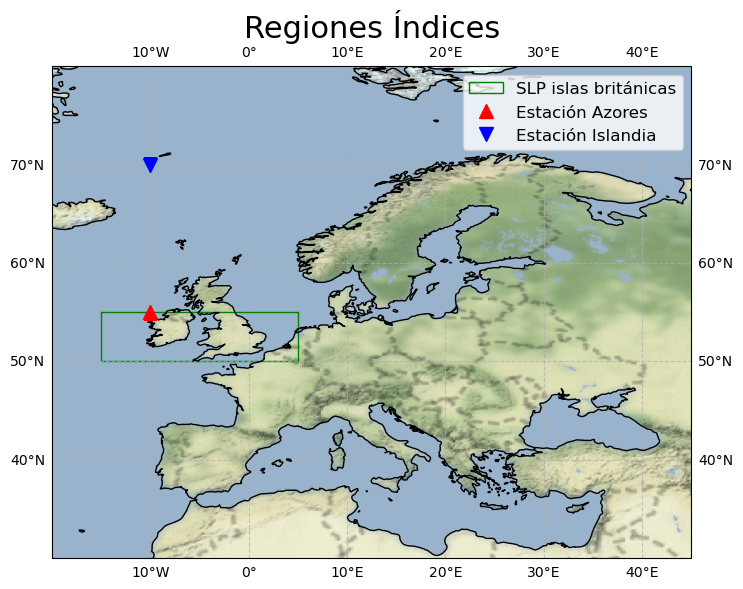

In [40]:
plt.style.use('default')
fig, ax = plt.subplots(figsize=(10, 6), ncols=1)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax.coastlines()

stamen_terrain = cimgt.Stamen('terrain-background')
zoom = 3
ax.add_image(stamen_terrain, zoom)

ax.set_global() # added following an answer to my question

ax.gridlines(draw_labels = True,linestyle='--',alpha=0.7,zorder=1)

ax.set_title('Localización origen datos Índice NAO',size=22)
ax.set_extent([-20,45,30,80], crs=ccrs.PlateCarree())


def pinta_region(lats,lons,color,ax=ax,label=None): #Codigo de Diego
    lat_corners = np.array([lats[0], lats[0],lats[1], lats[1]])
    lon_corners = np.array([ lons[0], lons[1], lons[1], lons[0]])
    poly_corners = np.zeros((len(lat_corners), 2), np.float64)
    poly_corners[:,0] = lon_corners
    poly_corners[:,1] = lat_corners
    poly = mpatches.Polygon(poly_corners, closed=True, ec=color, fill=False, lw=1, fc=color,label=label)#, transform=ccrs.Geodetic())
    ax.add_patch(poly)


#los,las= np.meshgrid(lon_red,lat_red)
ax.set_title('Regiones Índices',size=22)
pinta_region([50,55],[-15,5],'green',ax,label='SLP islas británicas')

ax.plot(punto_irlanda[1],punto_irlanda[0],'r^',label='Estación Azores',markersize=10)
ax.plot(punto_mardelnorte[1],punto_mardelnorte[0],'bv',label='Estación Islandia',markersize=10)

plt.tight_layout()
ax.legend(prop={'size':12},loc='best',facecolor="white")
fig.savefig('Region_indices.png',dpi=500,facecolor='w')

In [41]:
lon_brit= [-15,5]
lat_brit= [55,50]
media_slp_islasbritanicas=  ((era_slp_julio.sel(longitude=slice(lon_brit[0],lon_brit[1]),latitude= slice(lat_brit[0],lat_brit[1]))).mean(dim=('latitude','longitude'))).msl
#lo estandarizamos
indice_islasbrit_estandarizado= (media_slp_islasbritanicas-media_slp_islasbritanicas.mean())/media_slp_islasbritanicas.std()

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


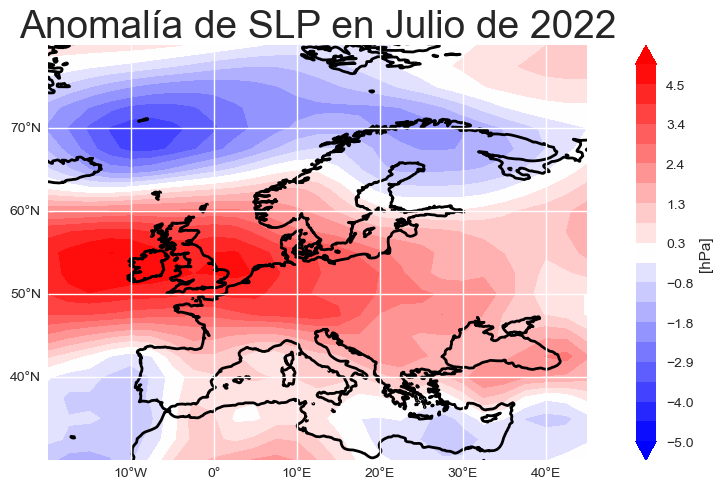

In [42]:
anom_slp_julio22= anom_slp_julio22.assign_coords(lon=(((anom_slp_julio22.lon + 180) % 360) - 180)).sortby('lon')
lon_lims= [-20,45]
lat_lims= [80,30]
anom_slp_julio22= anom_slp_julio22.sel(lon=slice(lon_lims[0],lon_lims[1]),lat= slice(lat_lims[0],lat_lims[1])).squeeze()
#representamos el mapa de anomalías para ver que todo va bien
plt.style.use('seaborn')
fig = plt.figure(figsize=(10,5)) 
ax1 = fig.add_subplot(111, projection=ccrs.PlateCarree())
maximo= np.max((abs(np.min(anom_slp_julio22.slp)),abs(np.max(anom_slp_julio22.slp))))
levels1 = np.round(np.linspace(-maximo,+maximo,num=20),decimals=1)
nombre='anomalia de slp en julio 2022.png'
dibujo_1_mapa_cartopy(anom_slp_julio22.slp,anom_slp_julio22.lon,anom_slp_julio22.lat,'bwr','[hPa]','Anomalía de SLP en Julio de 2022', ax1,levels1,nombre)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\3761196339.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "fpi" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(nombre,fpi=300)


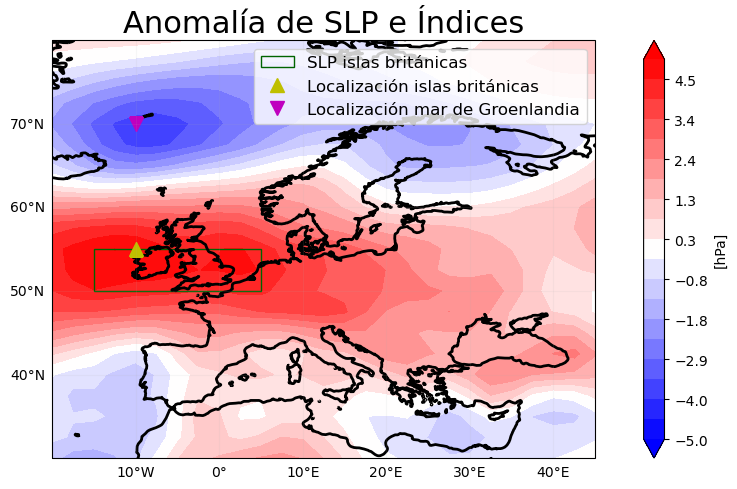

In [59]:
plt.style.use('default')
fig = plt.figure(figsize=(10,5)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
maximo= np.max((abs(np.min(anom_slp_julio22.slp)),abs(np.max(anom_slp_julio22.slp))))
levels1 = np.round(np.linspace(-maximo,+maximo,num=20),decimals=1)
nombre='anomalia de slp en julio 2022 con regiones indices.png'
im= ax.contourf(anom_slp_julio22.lon,anom_slp_julio22.lat,anom_slp_julio22.slp,cmap='bwr',levels=levels1,extend='both',transform=ccrs.PlateCarree())
ax.coastlines(linewidth=2)
ax.set_title('Anomalía de SLP en Julio de 2022',fontsize=28)
gl=ax.gridlines(draw_labels = True, alpha=0.1)
gl.ylabels_right = False
gl.xlabels_top = False
fig.colorbar(im,ax=ax,label='[hPa]')

ax.set_title('Anomalía de SLP e Índices',size=22)
pinta_region([50,55],[-15,5],'darkgreen',ax,label='SLP islas británicas')

ax.plot(punto_irlanda[1],punto_irlanda[0],'y^',label='Localización islas británicas',markersize=10)
ax.plot(punto_mardelnorte[1],punto_mardelnorte[0],'mv',label='Localización mar de Groenlandia',markersize=10)
plt.tight_layout()
ax.legend(prop={'size':12},loc='best',facecolor="white")
plt.savefig(nombre,fpi=300)
plt.show()

In [60]:
#ahora calculamos la anomalías (para cada punto) respectivas en los datos de ERA de SLP
anom_era_slp_julio= era_slp_julio-era_slp_julio.mean(dim='time')
#hacemos un remallado de las latitudes y longitudes de era para tener la misma que para julio de 2022
latitud_remallado= anom_slp_julio22.lat
longitud_remallado= anom_slp_julio22.lon
anom_era_slp_julio_remallado= anom_era_slp_julio.interp(latitude=np.array(latitud_remallado)).interp(longitude=np.array(longitud_remallado))

#correlacionamos el mapa de anomalías de julio de 2022 con las anomalias de era, para ello, tenemos que hacer un reshape de los datos
nlat,nlon= np.shape(np.array(anom_slp_julio22.slp))
anom_slp_julio22_reshape= np.reshape(np.array(anom_slp_julio22.slp),(nlat*nlon))

nt,nlat,nlon= np.shape(np.array(anom_era_slp_julio_remallado.msl))
anom_era_slp_julio_remallado_reshape= np.reshape(np.array(anom_era_slp_julio_remallado.msl),(nt,nlat*nlon))

correlacion= np.dot(np.transpose(anom_slp_julio22_reshape),np.transpose(anom_era_slp_julio_remallado_reshape)).squeeze()
#estandarizamos el índice
correlacion_estandarizado= (correlacion-correlacion.mean())/correlacion.std()

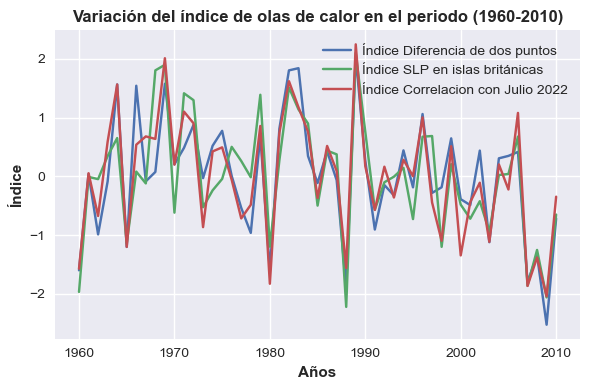

In [77]:
plt.style.use('seaborn')
fig,ax=plt.subplots(figsize=(6,4))
ax.plot(years,indice_estandarizado,label='Índice Diferencia de dos puntos')
ax.plot(years,indice_islasbrit_estandarizado,label='Índice SLP en islas británicas')
ax.plot(years,correlacion_estandarizado,label='Índice Correlacion con Julio 2022')
ax.set_xlabel('Años', weight='bold')
ax.set_ylabel('Índice', weight='bold')
ax.set_title('Variación del índice de olas de calor en el periodo (1960-2010)',fontsize=12, weight='bold')
ax.legend()
plt.tight_layout()
plt.savefig('variación de los distintos índices en el periodo de estudio.png')

Vemos como los tres índices son válidos, aunque en principio, el de la correlación en principio tiene en cuenta más el patrón general de las SLP, por ello, será el que usaremos a partir de ahora

En la siguiente celda tenemos las funciones necesarias para hacer el análisis de la serie temporal

In [65]:
def runningMean(x,T):
    y = x.copy() * np.NaN
    N = x.size
    ini = int((T-1)/2)
    fin = int(T/2)
    for i in range(ini,N-fin):
        y[i] = np.mean(x[i-ini:i+fin+1])
    return y


def espectroArmonico(x,At):
    x = np.squeeze(np.array(x))
    N = x.size 
    xm = x.mean()
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    jvec=np.arange(1,N+1)
    a = np.zeros(Nmax)
    b = np.zeros(Nmax)
    xa = x-xm
    fac = 2*np.pi*jvec/N
    for k in range(Nmax):
        a[k] = 2 / N * np.sum( np.matmul(xa,np.cos(fac*(k+1)) ))
        b[k] = 2 / N * np.sum( np.matmul(xa,np.sin(fac*(k+1)) ))
    if (N%2)==0: b[Nmax-1]=0
    kvec = np.arange(1,Nmax+1)
    # Habría que dividir entre 4, pero como sólo damos la parte positiva, para
    # que la suma de G nos aporte la varianza dividimos sólo entre 2
    G = ( a**2+b**2 ) / 2
    f = kvec/(N*At)
    return f,G

def espectroFFT(x,At):
    x = np.squeeze(np.array(x))
    N=x.size
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    y = fft(x)
    ap = 2/N*np.real(y[1:Nmax+1])
    bp =  - 2/N*np.imag(y[1:Nmax+1])
    xm = np.mean(x)
    kvec = np.arange(1,Nmax+1)
    # Habría que dividir entre 4, pero como sólo damos la parte positiva, para
    # que la suma de G nos aporte la varianza dividimos sólo entre 2
    G = ( ap**2+bp**2 ) / 2
    f = kvec/(N*At)
    return f,G

def redSpectra(a,s2):
    f = np.arange(.0,.51,.01)
    N = f.size
    G = (s2*(1-a**2))/(1+a**2-2*a*np.cos(2*np.pi*f))
    #Hay que multiplicar por 2 porque sólo sacamos la parte positiva
    return f,2*G

def ajusteArmonico(x,numArm):
    x = np.squeeze(np.array(x))
    N = x.size 
    xm = x.mean()
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    jvec=np.arange(1,N+1)
    a = np.zeros(Nmax)
    b = np.zeros(Nmax)
    xa = x-xm
    fac = 2*np.pi*jvec/N
    for k in range(Nmax):
        a[k] = 2 / N * np.sum( np.matmul(xa,np.cos(fac*(k+1)) ))
        b[k] = 2 / N * np.sum( np.matmul(xa,np.sin(fac*(k+1)) ))
    if (N%2)==0: b[Nmax-1]=0
    kvec = np.arange(1,Nmax+1)
    xhat = np.zeros(N)
    n = np.min([numArm,Nmax])
    for j in range(N):
        xhat[j] =  xm + np.sum( a[:n] * np.cos (2*np.pi*kvec[:n]*(j+1)/N) + b[:n] *
                               np.sin (2*np.pi*kvec[:n]*(j+1)/N) )
    return xhat,a,b

def ajusteArmonicoFFT(x,numArm):
    x = np.squeeze(np.array(x))
    N=x.size
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    y = fft(x)
    ap = 2/N*np.real(y[1:Nmax+1])
    bp =  - 2/N*np.imag(y[1:Nmax+1])
    xm = np.mean(x)
    kvec = np.arange(1,Nmax+1)
    xhat = np.zeros(N)
    n = np.min([numArm+1,Nmax])
    for j in range(N):
        xhat[j] =  xm + np.sum( ap[:n] * np.cos (2*np.pi*kvec[:n]*(j)/N) + bp[:n] * 
                               np.sin (2*np.pi*kvec[:n]*(j)/N) )
    return xhat,ap,bp

def calculoAR1(x):
    xm = np.mean(x)
    N = x.size
    cor = stattools.acf(x, fft=False, nlags = 1) * N/(N-1)
    a = cor[1]
    sx = np.std(x, ddof=1)
    fac = np.sqrt((N-1)/(N-2)*(1-a**2))*sx
    AR1 = x * np.NaN
    rng = np.random.default_rng()
    Z = rng.normal(0,1,N)
    #También podéis generar el ruido blanco con stats de scipy
    #Z = stats.norm.rvs(size=N)
    AR1[0] = Z[0]
    for i in range(N-1):
        AR1[i+1] =  a * ( AR1[i] ) + fac * Z[i+1]
    return AR1 + xm


def calculoAutocov(x,nlag):
    cov = np.zeros([nlag+1])
    N = x.size
    xm = np.mean(x)
    ax = x-xm
    for t in range(nlag+1):
        cov[t] = np.sum(ax[:N-t]*ax[t:])/(N-1)
    return cov

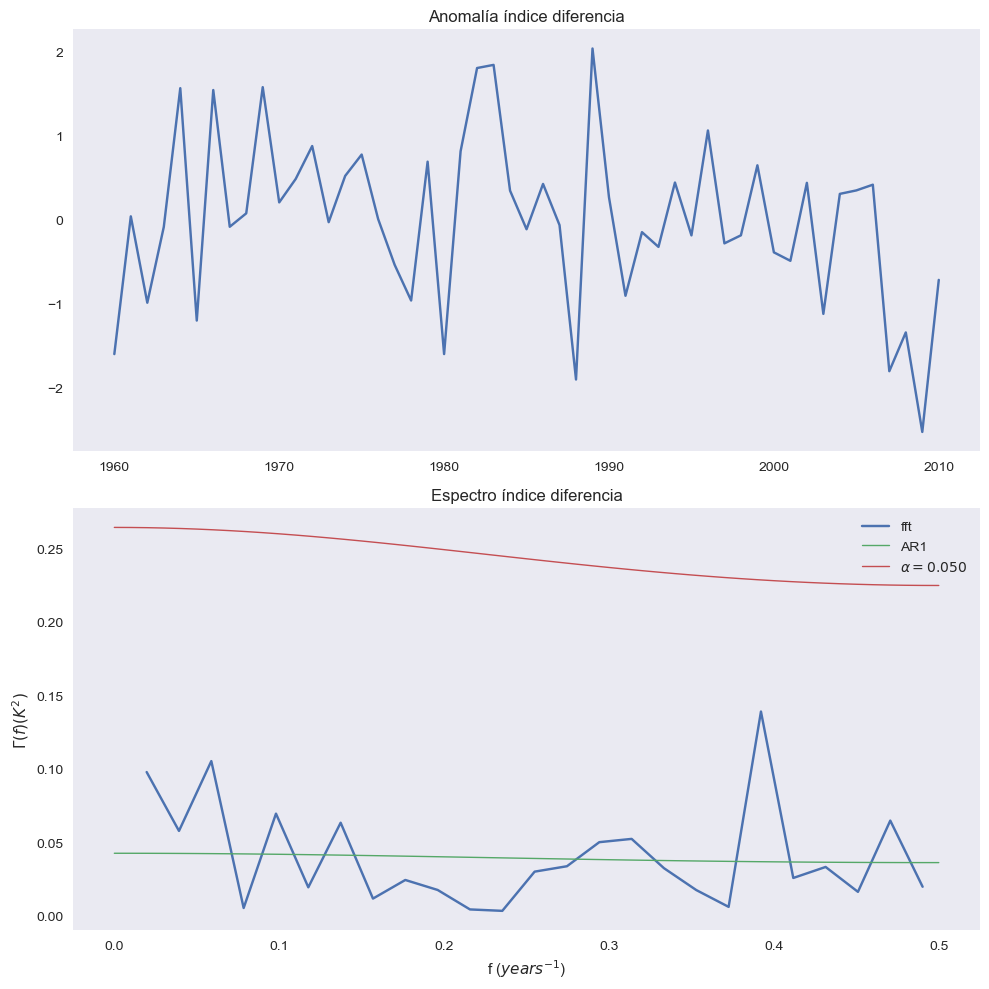

In [94]:
julio= np.array(indice_estandarizado)

time= years
x_day=julio

fig,((ax0,ax1))=plt.subplots(2,1,figsize=(10,10),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Anomalía índice diferencia')

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro índice diferencia')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]


#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.05
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()


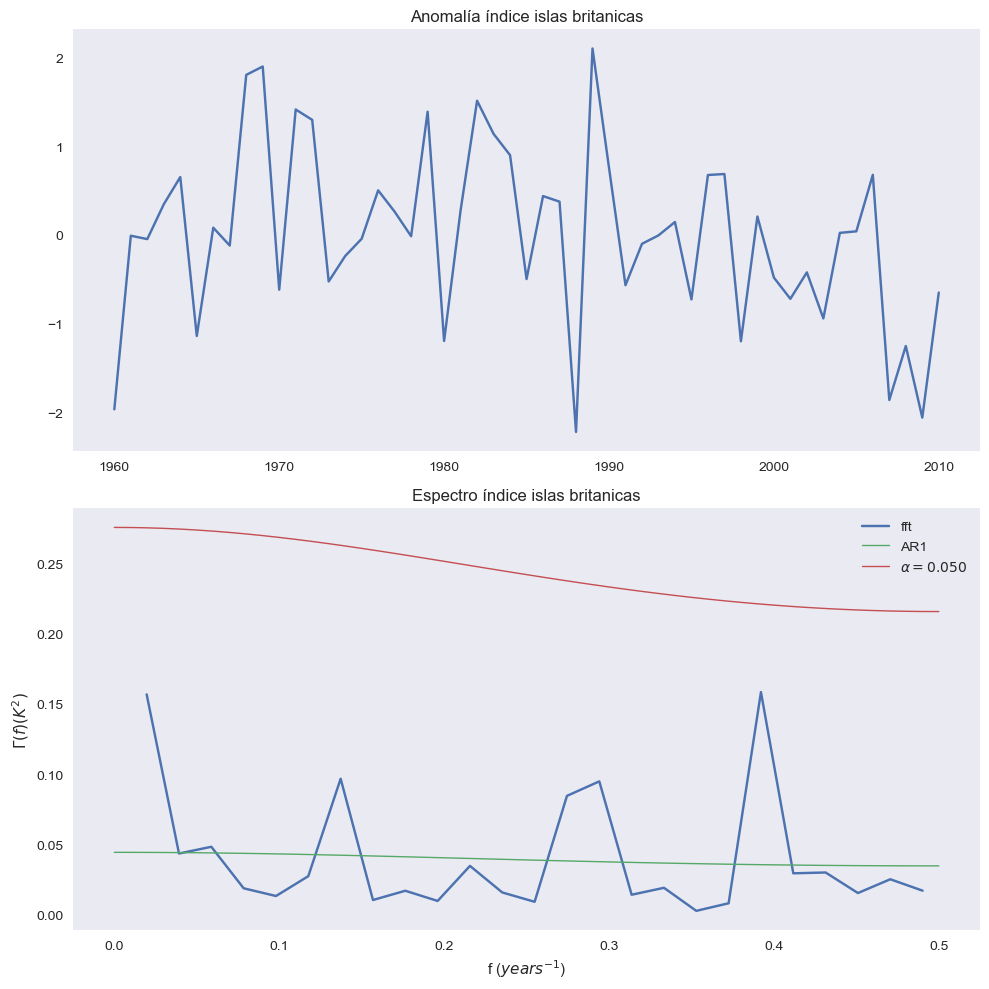

In [66]:
julio= np.array(indice_islasbrit_estandarizado)

time= years
x_day=julio

fig,((ax0,ax1))=plt.subplots(2,1,figsize=(10,10),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Anomalía índice islas britanicas')

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro índice islas britanicas')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]


#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.05
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()


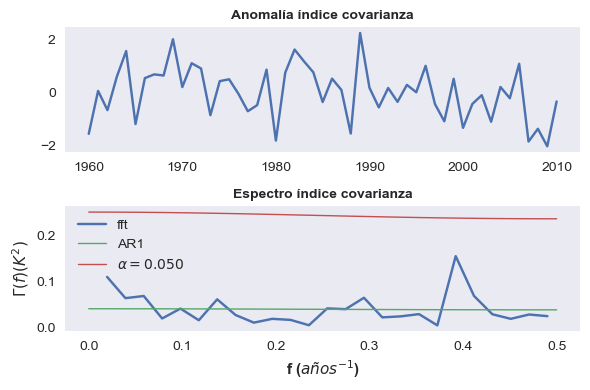

In [76]:
julio= np.array(correlacion_estandarizado)

time= years
x_day=julio

fig,((ax0,ax1))=plt.subplots(2,1,figsize=(6,4),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Anomalía índice covarianza',fontsize=10, weight='bold')

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$', weight='bold')
ax1.set_xlabel(r'f ($años^{-1}$)', weight='bold')
ax1.set_title('Espectro índice covarianza',fontsize=10, weight='bold')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.05
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()
plt.savefig('espectrograma de indice de correlacion.png')

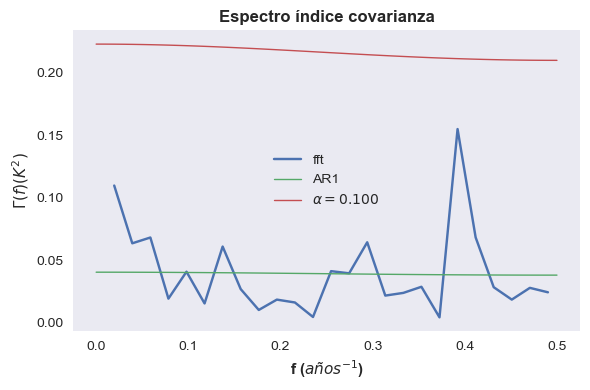

In [80]:
julio= np.array(correlacion_estandarizado)

time= years
x_day=julio

fig,((ax1))=plt.subplots(1,1,figsize=(6,4),tight_layout=True)

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$', weight='bold')
ax1.set_xlabel(r'f ($años^{-1}$)', weight='bold')
ax1.set_title('Espectro índice covarianza',fontsize=12, weight='bold')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.1
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()
plt.savefig('espectrograma de indice de correlacion.png')

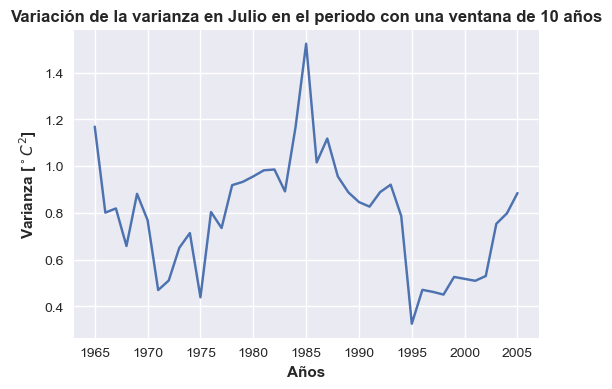

In [75]:
def varianza(dias,tiempo,ventana):
    data1= dias
    periodo= tiempo[ventana:-ventana]
    var_1= np.empty((data1.shape[0])-2*ventana)
    s=0
    for i in range(ventana,data1.shape[0]-ventana):
        var_1[s]=np.var(data1[i-ventana:i+ventana])    
        s+=1
    return periodo,var_1

periodo,varianza= varianza(np.array(correlacion_estandarizado),years,ventana=5)
fig,ax= plt.subplots(figsize=(6,4))
plt.title('Variación de la varianza en Julio en el periodo con una ventana de 10 años',fontsize=12, weight='bold')
plt.plot(periodo,varianza)
plt.xlabel('Años', weight='bold')
plt.ylabel('Varianza [$^\circ C^2$]', weight='bold')
plt.savefig('variacion de la varianza en ventanas de 10 años para indice de correlacion.png')

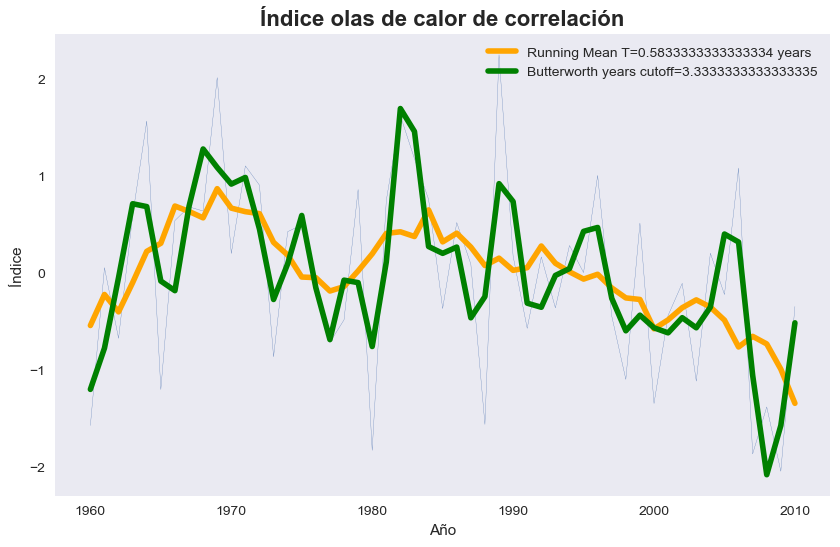

In [98]:
#no tenemos ningún pico significativo, pero vamos a tomar el de frecuencia 0.4 años^-1 como el fundamental
frec_pico= 0.3

#filtramos ahora la señal para quedarnos solo con las frecuencias superiores al pico (frecuencias altas)
fig,ax1= plt.subplots(1,1,figsize=(10,6))

# La señal inicial
x = np.squeeze(np.array(correlacion_estandarizado))
t = np.squeeze(np.array(years))
N = x.size
ax1.plot(t,x,linewidth=0.2)


#Voy a usar la condición mínima derivada en ambos extremos:
xtot = np.append(np.flip(x),[x,np.flip(x)])

# frecuencia de corte (en años):
nyc = 1/frec_pico
Tc = nyc * 1
fc = 1 / Tc

#Media móvil: necesito una ventana de aprox. Tc/0.443
Window = int(Tc/0.443)
#Window = Tc

#Filtro la señal ampliada y luego me quedo con el trozo central
ytot = runningMean(xtot,Window)
yRunningMean = ytot[N:2*N]


#Filtro de Butterworth, escogemos orden nominal 4
#Cuidado que el filtro de Butter tiene la frecuencia normalizada con 1 correspondiendo a fmax=FNyquist
n = 4
b,a = signal.butter(n,fc*2,output='ba')
#Filtro la señal ampliada y me quedo con la parte central:
ytot = signal.filtfilt(b,a,xtot)
yButter = ytot[N:2*N]


ax1.grid()
ax1.set_title('Índice olas de calor de correlación',fontsize=16,weight='bold')
ax1.set_xlabel('Año')
ax1.set_ylabel('Índice')
ax1.plot(t,yRunningMean,linewidth= 4,color='orange',label='Running Mean T='+str(Window/12)+' years')
ax1.plot(t,yButter,linewidth= 4,color='green',label='Butterworth years cutoff='+str(nyc))
ax1.legend()
plt.savefig('Filtrado indice de correlación.png')

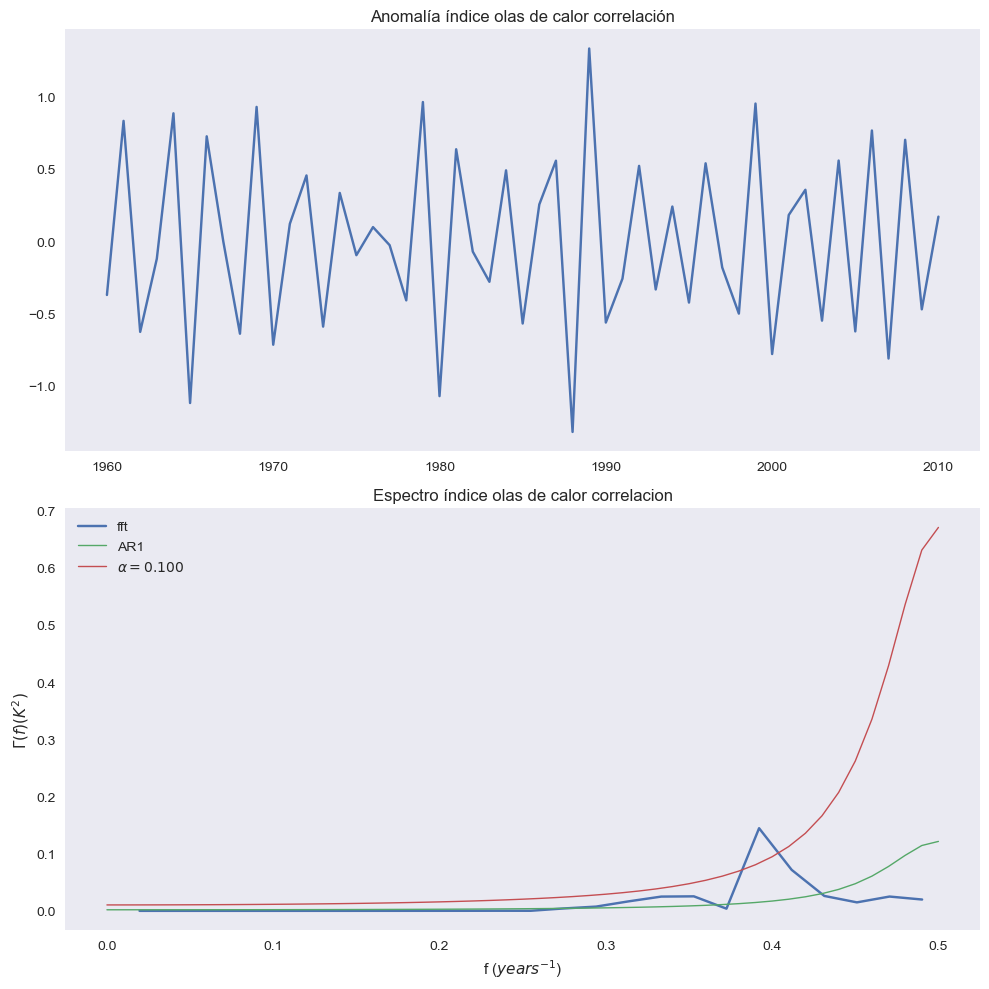

In [99]:
#para quedarnos con las frecuencias altas, haremos lo siguiente
time= t
x_day= np.array(correlacion_estandarizado)-yButter

fig,((ax0,ax1))=plt.subplots(2,1,figsize=(10,10),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Anomalía índice olas de calor correlación')

#fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro índice olas de calor correlacion')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]


#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.1
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()


Vamos ahora a calcular el valor de retorno de las temperaturas máximas de Julio en la Península Ibérica. Para ello, tomamos las temperaturas máximas en toda la península 

(en la siguiente celda se encuentran las funciones necesarias para el cálculo estadístico)

In [87]:
def nor(mu,sigma,x):
    #Nota: también podrías usar la función norm.pdf(x,k) del módulo stats del paquete scipy
    N=1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
    return N

def GEV(x,c):
    #Función que calcula la función densidad de probabilidad de Generalized Extrem Value normalizada
    # con m = 0, s = 1
    #nota: también puedes usar g=stats.genextreme.pdf(x,-c)
    if ( abs(c) < 0.005 ) :
        g = np.exp(-np.exp(-x))*np.exp(-x)
    else:
        g = ( np.power( 1 + c * x , -1-1/c) ) * np.exp( - np.power(1 + c * x ,-1/c) )
    return g

def GEVms(x,c,m,s):
    #Función que calcula la función de densidad de probabilidad Generalizada Extreme Value sin normalizar
    y = ( x - m ) / s
    if ( abs(c) < 0.005 ) :
        g = ( np.exp(-np.exp(-y))*np.exp(-y) ) / s
    else:
        g = ( np.power( 1 + c * y , -1-1/c) ) * np.exp( - np.power(1 + c * y ,-1/c) ) / s
    return g

def GPDs(y,c,s):
    #Función que calcula la función de densidad de probabilidad de Pareto Generalizada 
    if (abs(c)<0.0001):
        h = np.exp(-y/s)*(1/s)
    else:
        h = (1/s) * ( 1 + c * y / s) ** (-1-1/c)
    h[y<=0]=0
    return h

def MLE_GEV(c,m,s,x):
    #Función que calcula la función likelihood sobre GEV con 
    #los parámetros de entrada c,m,s
    #y la muestra de datos x
    if ( (s < 0) | np.any(1 + c * (x-m)/s ) < 0):
        sal=1e7
    else:            
        if (abs(c) > 0.00001 ):
            t = (1 + c * (x-m)/s )**(-1/c)
        else :
            t = np.exp(-(x-m)/s)
        f = - np.log(s) + (c +1)*np.log(t) -t
        sal = f.sum()
    return -sal


def returnLevel(p, c,m,s):
    if (abs(c) > 0.00001 ):
        zp = m - ( s / c ) * ( 1 - ( - np.log( 1 - p ) ) ** ( - c ))
    else :
        zp = m - s * np.log( - np.log( 1 - p ) )
    return zp


def densityPlotGEV(ax,x,c,m,s):
    n, bins, dummy = ax.hist(x,density=True,label='Empirica')
    x1, x2 = 2*bins[0] - bins[1], 2* bins[-1] - bins[-2]
    ax.set_xlim(x1,x2)
    x_x = np.linspace(x1,x2,200)
    y_y = GEVms(x_x,c,m,s)
    ax.plot(x_x,y_y,'r',label='Ajuste')
    ax.legend()
    ax.grid()
    ax.set_ylabel('probabilidad f(z)')
    ax.set_xlabel('z')
    return

def probabilityPlot(ax,pExp,pTeor):
    ax.plot([0,1],[0,1])
    ax.plot(pExp,pTeor,'o')
    ax.set_ylabel('Modelo')
    ax.set_xlabel('Empírico')
    ax.set_title('Probabilidad')
    ax.grid()
    return

def quantilePlot(ax,xTeor,xSort):
    ax.plot([xSort[0],xSort[-1]],[xSort[0],xSort[-1]])
    ax.plot(xTeor,xSort,'o')
    ax.set_ylabel('Modelo')
    ax.set_xlabel('Empírico')
    ax.set_title('Cuantiles')
    ax.grid()
    return

def returnPlot(ax,p,zp,pExp,xSort):
    ax.semilogx(1/p,zp)
    ax.grid()
    ax.set_xlim(1e-1,1e3)
    ax.semilogx(1/pExp,xSort,'o')
    ax.set_title('Nivel de Retorno')
    ax.set_xlabel('Periodo de retorno [años]')
    ax.set_ylabel('Nivel de retorno')
    return
    
def diagnosticsGEV(x,c,m,s):
    y = (x-m)/s
    ySort = np.sort(y)
    pExp = np.arange(1,ySort.size+1,1)/(ySort.size+1)
    pTeor = stats.genextreme.cdf(ySort,-c)
    xSort = np.sort(x)
    pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
    pExpinv = np.arange(xSort.size+1,1,-1)/(xSort.size+1)
    xTeor = returnLevel(1-pExp, c,m,s)    
    p = np.logspace(-2, -1e-2, 100)
    zp=returnLevel(p,c,m,s)
    fig, ax = plt.subplots(2, 2, figsize=(14,10))
    probabilityPlot(ax[0,0],pExp,pTeor)
    quantilePlot(ax[0,1],xTeor,xSort)
    returnPlot(ax[1,0],p,zp,pExpinv,xSort)
    densityPlotGEV(ax[1,1],x,c,m,s)
    fig.suptitle('Diagnósticos',weight='bold',fontsize=18)
    return

def diagnosticsGPD(x,c,m,s,numYears):
    fig, ax = plt.subplots(2, 2, figsize=(14,10))
    fig.suptitle('Diagnostics',weight='bold',fontsize=18)
    xSort = np.sort(x)
    pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
    pExpinv = np.arange(xSort.size+1,1,-1)/(xSort.size+1)
    rv = stats.genpareto(c,m,s)
    pTeor = rv.cdf(xSort)
    xTeor = rv.ppf(pExp)
    fac = x.size / numYears
    p = np.logspace(-4, 2 , 100)
    zp = rv.ppf(1-p)
    fac = x.size / numYears
    returnPlot(ax[1,0],p*fac,zp,pExpinv*fac,xSort)
    probabilityPlot(ax[0,0],pExp,pTeor)
    quantilePlot(ax[0,1],xTeor,xSort)
    densityPlotGPD(ax[1,1],x,c,m,s)
    return

def densityPlotGPD(ax,x,c,m,s):
    n, bins, dummy = ax.hist(x,density=True,label='Empirica')
    x1, x2 = 2*bins[0] - bins[1], 2* bins[-1] - bins[-2]
    ax.set_xlim(x1,x2)
    x_x = np.linspace(x1,x2,200)
    y_y = stats.genpareto.pdf(x_x,c,m,s)
    ax.plot(x_x,y_y,'r',linewidth = 4, label='Ajuste')
    ax.legend()
    ax.grid()
    ax.set_ylabel('probabilidad h(x)')
    ax.set_xlabel('x')
    return

MLE =79.824
c=-0.390
m=28.918
s=1.244
100yr return value = 30.781


C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\4164258166.py:22: RuntimeWarning: invalid value encountered in power
  g = ( np.power( 1 + c * y , -1-1/c) ) * np.exp( - np.power(1 + c * y ,-1/c) ) / s


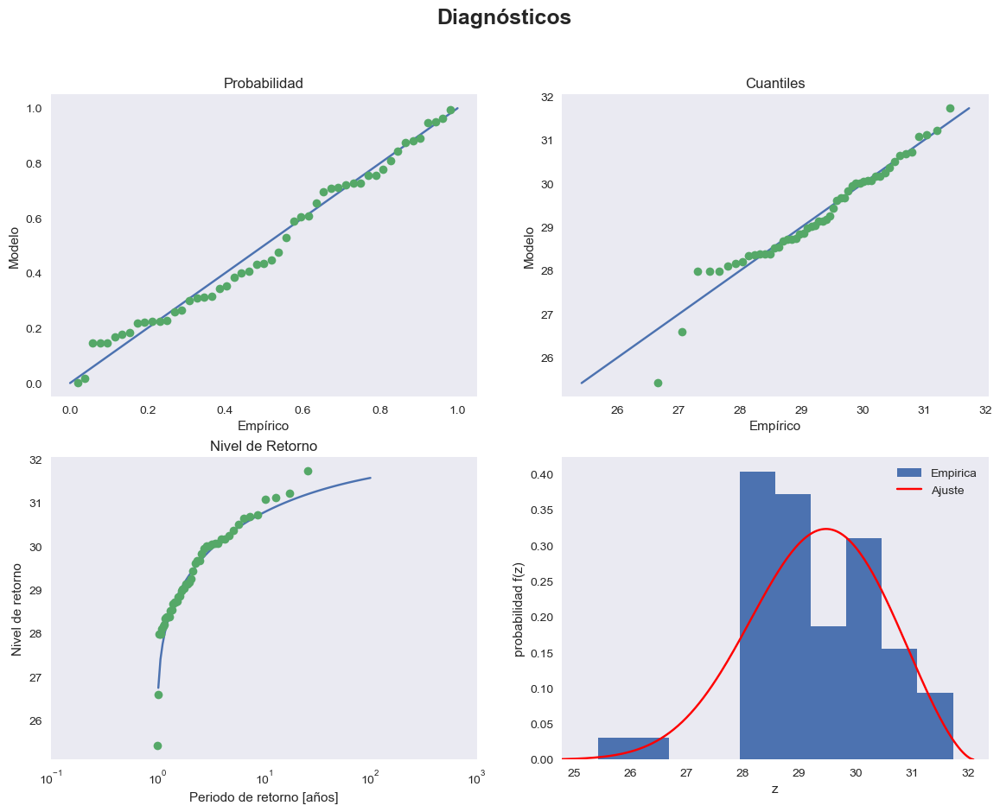

In [89]:
#Ajuste usando herramienta de scipy:
#x = (maximas_julio.groupby('Time.year').max()) #media de cada Julio por punto (pasamos de 31 días por año a 1 día)
x= maximas_julio.mean(dim=('lat','lon')).tx #media de toda España (pasamos de lat*lon a 1 punto)
x = (x.groupby('Time.year').mean()) #media de cada Julio por punto (pasamos de 31 días por año a 1 día)

c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
#usamos los valores ajustados para calcular el valor de retorno para 100 años
print('100yr return value = '+'%.3f'%(returnLevel(0.1,c,m,s)))
fig= diagnosticsGEV(x,c,m,s)
plt.savefig('analisisgev_detemperaturas_maximas.png')


Ahora vamos a calcular los periodos de retorno de algunos valores alcanzados en puntos de la península en 2022
1. 46.0 ºC registrados en Morón de la Frontera el día 24 de Julio
2. 45.1 ºC medidos el día 25 en Murcia y Alcantarilla/base aérea
3. 44.8 ºC de Sevilla/aeropuerto el día 13

In [90]:
def returnPlot(ax,p,zp,pExp,xSort,hline):
    ax.semilogx(1/p,zp,label='Ajuste teórico')
    ax.axhline(xmin=0,y=hline,color='r',label='Valor registrado')
    diferencia=np.abs((np.abs(zp)-hline))
    corte= p[np.where(diferencia==np.min(diferencia))[0]]
    ax.axvline(x=1/corte,color='k',ls='--',label='Periodo de retorno')
    print('Periodo de retorno= %.2e [años]'%(1/corte))
    ax.grid()
    ax.set_xlim(0.5,100e3)
    ax.set_ylim(ymax=50,ymin=32)
    ax.semilogx(1/pExp,xSort,'o')
    ax.set_title('Nivel de Retorno')
    ax.set_xlabel('Periodo de retorno [años]')
    ax.set_ylabel('Valor de retorno')
    ax.legend()
    return

def diagnosticsGEV(x,c,m,s,hline):
    y = (x-m)/s
    ySort = np.sort(y)
    pExp = np.arange(1,ySort.size+1,1)/(ySort.size+1)
    pTeor = stats.genextreme.cdf(ySort,-c)
    xSort = np.sort(x)
    pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
    pExpinv = np.arange(xSort.size+1,1,-1)/(xSort.size+1)
    xTeor = returnLevel(1-pExp, c,m,s)    
    p = np.logspace(0, -1000e-2, 100)
    zp=returnLevel(p,c,m,s)
    fig, ax = plt.subplots(2, 2, figsize=(14,10))
    probabilityPlot(ax[0,0],pExp,pTeor)
    quantilePlot(ax[0,1],xTeor,xSort)
    returnPlot(ax[1,0],p,zp,pExpinv,xSort,hline)
    densityPlotGEV(ax[1,1],x,c,m,s)
    fig.suptitle('Diagnostics',weight='bold',fontsize=18)
    return

MLE =103.968
c=-0.334
m=36.731
s=1.907
100yr return value = 41.210
Periodo de retorno= 1.00e+10 [años]


C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\4164258166.py:52: RuntimeWarning: divide by zero encountered in log
  zp = m - ( s / c ) * ( 1 - ( - np.log( 1 - p ) ) ** ( - c ))


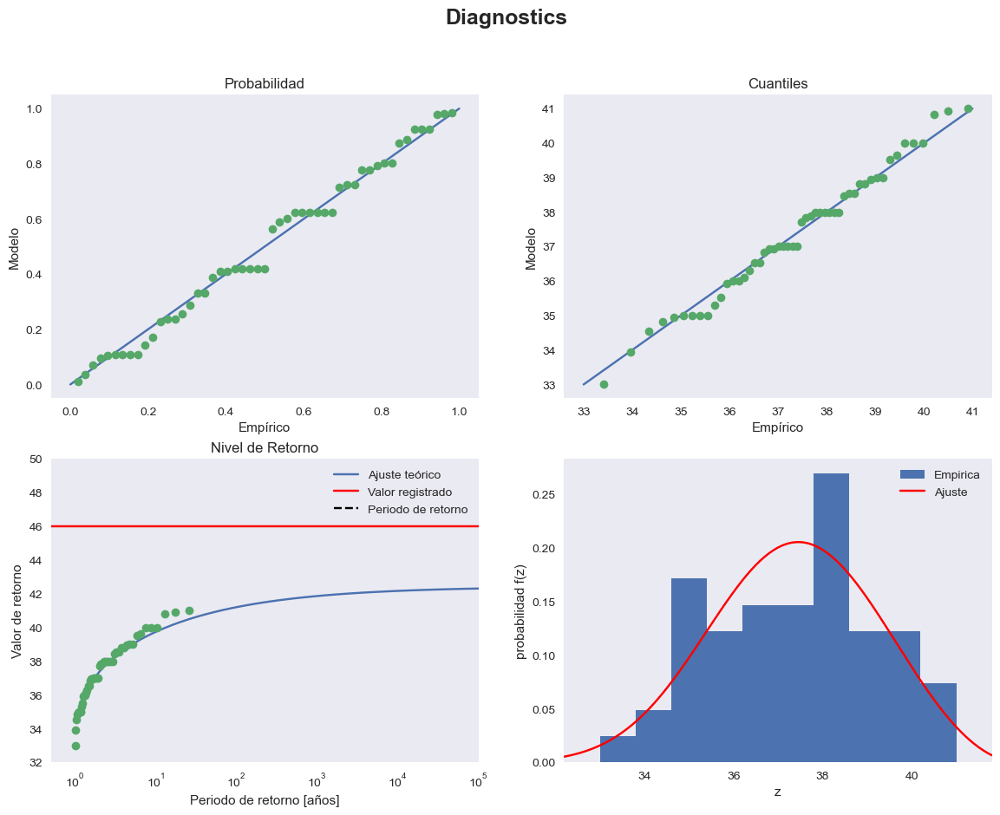

In [91]:
#1. Morón de la Frontera, buscamos la latitud/longitud de esta localidad
latitud_moron= 37.07
longitud_moron= -5.27
datos_moron= maximas_julio.sel(lat=latitud_moron,lon=longitud_moron,method='nearest')
x= (datos_moron.groupby('Time.year').max()).tx
c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
#usamos los valores ajustados para calcular el valor de retorno para 100 años
print('100yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))
fig= diagnosticsGEV(x,c,m,s,hline=46.0)
plt.savefig('analisisgev_de_moron.png')

MLE =103.881
c=-0.156
m=37.079
s=1.725
100yr return value = 42.740
Periodo de retorno= 4.33e+03 [años]


C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\4164258166.py:52: RuntimeWarning: divide by zero encountered in log
  zp = m - ( s / c ) * ( 1 - ( - np.log( 1 - p ) ) ** ( - c ))


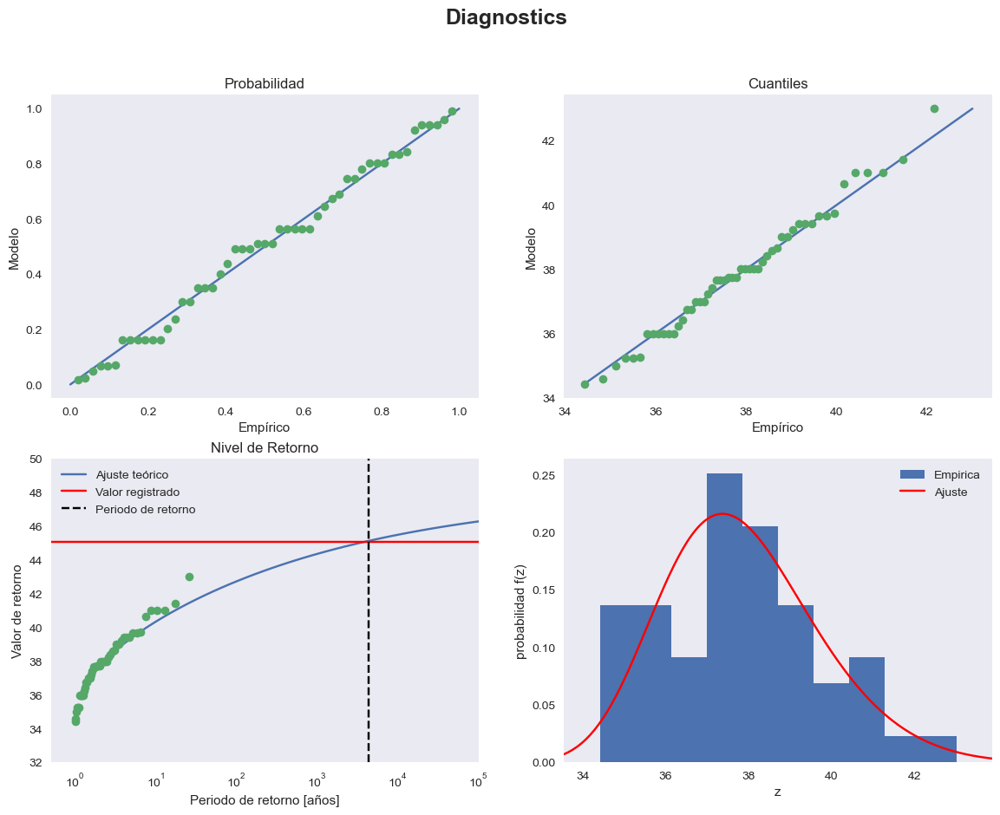

In [94]:
#2. Murcia/Alcantarilla, buscamos la latitud/longitud de esta localidad
latitud_murcia= 37.95
longitud_murcia= -1.23
datos_murcia= maximas_julio.sel(lat=latitud_murcia,lon=longitud_murcia,method='nearest')
x= (datos_murcia.groupby('Time.year').max()).tx
c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
#usamos los valores ajustados para calcular el valor de retorno para 100 años
print('100yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))
diagnosticsGEV(x,c,m,s,hline=45.1)
plt.savefig('analisisgev_de_murcia.png')

MLE =98.249
c=-0.255
m=39.128
s=1.644
100yr return value = 43.582
Periodo de retorno= 4.33e+03 [años]


C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\4164258166.py:52: RuntimeWarning: divide by zero encountered in log
  zp = m - ( s / c ) * ( 1 - ( - np.log( 1 - p ) ) ** ( - c ))


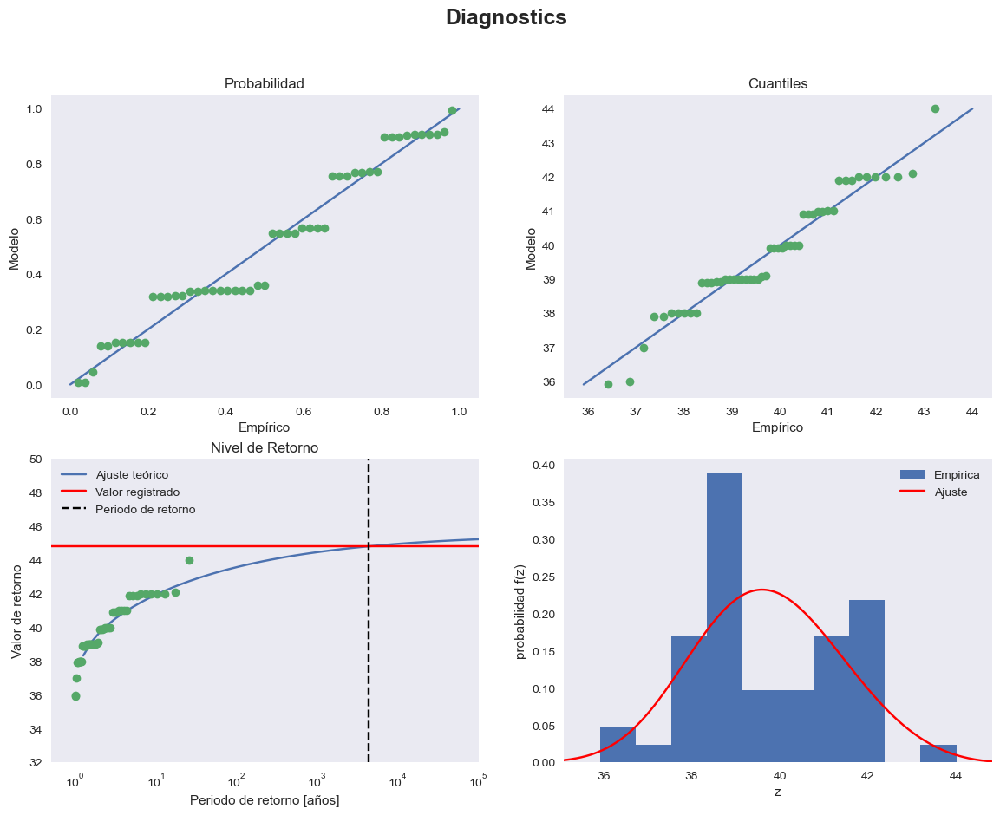

In [95]:
#3. Sevilla, buscamos la latitud/longitud de esta localidad
latitud_sevilla= 37.42
longitud_sevilla= -5.89
datos_sevilla= maximas_julio.sel(lat=latitud_sevilla,lon=longitud_sevilla,method='nearest')
x= (datos_sevilla.groupby('Time.year').max()).tx

c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
#usamos los valores ajustados para calcular el valor de retorno para 100 años
print('100yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))
diagnosticsGEV(x,c,m,s,hline=44.8)
plt.savefig('analisisgev_de_sevilla.png')

IMPORTANTE: En pareto meter todos los dias y en GEV solo las temperaturas máximas de cada julio de cada año

### Ejercicio 3: Mapas de Regresión

Vamos a correlacionar el índice de presión que hemos elegido con diferentes campos globales
### A. SLP:

En la siguiente celda se encuentran las funciones necesarias para hacer las correlaciones

In [ ]:
def region(A,lon,lat,lonmin,lonmax,latmin,latmax):
    nt, nlat, nlon = A.shape
    #lonmin,lonmax,latmin,latmax = 260, 360, 10, 75
    AN = A[:,:,(lon>lonmin)&(lon<lonmax)][:,(lat>latmin)&(lat<latmax),:]
    lon_AN= lon[(lon>lonmin)&(lon<lonmax)]
    lat_AN=lat[(lat>latmin)&(lat<latmax)]
    return lat_AN, lon_AN, AN

def dibujo_1_mapa_cartopy(A,lon,lat,levs,cmap1,l1,titulo, ax):
    im=ax.contourf(lon,lat,A
                   ,cmap=cmap1,levels=levs,extend='both',transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=2);
    ax.set_title(titulo,fontsize=28)
    cbar = plt.colorbar(im, extend='neither', spacing='proportional',
                orientation='vertical', shrink=0.7, format="%2.2f")
    cbar.set_label(l1, size=28)
    cbar.ax.tick_params(labelsize=28) 
# Esta función te sirve para dibujar en una misma figura dos mapas superpuestos, como podría ser
# el caso de un mapa A de regresion y un mapa B de correlacion significativa, del que solo te interesa
# las regiones donde es significativa la señal
def dibujo_2_mapas_cartopy_hatches(A,B,lon,lat, levs, cmap1, l1, t1):

    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(0))
    
    im = ax.contourf(lon,lat,A.reshape(len(lat),len(lon)), 
                     extend='both',cmap=cmap1,levels=levs,transform = ccrs.PlateCarree())

    ax.coastlines(linewidth=2); 
    fig.colorbar(im,ax=ax,label = l1) #Para la barra de colores
    im = ax.contourf(lon,lat,B.reshape(len(lat),len(lon))
                 ,extend='both'
                 ,hatches='.',cmap=cmap1,alfa=0,levels=levs,transform = ccrs.PlateCarree())
    #el uso de alfa=0 lo que hace es que solo salgan los puntos y no salgan los colors porque los pones totalmente transparentes
    ax.set_ylim(lat[-1], lat[0])
    ax.set_xlim(lon[0], lon[-1])

def anom(X,nyr,par):
    # si par = st, anomalías estandarizadas  
    ns,nt=np.shape(X) 
    nmes=int(nt/nyr)
    An=ma.empty([ns,nt])
    
    A = X.reshape(nyr,nmes,ns)
    mA = np.mean(A,axis=(0,1))

    An = A - mA
    
    if par == 'st':
        An = An/np.std(An,axis=(0,1))

    return An.reshape(ns,nyr*nmes)

# función pearsonr para y 2D, x 1D
def pearsonr_2D(y, x):
    upper = np.sum((x - np.mean(x)) * (y - np.mean(y, axis=1)[:,None]), axis=1)
    lower = np.sqrt(np.sum(np.power(x - np.mean(x), 2)) * np.sum(np.power(y - np.mean(y, axis=1)[:,None], 2), axis=1))
    rho = upper / lower
    return rho


# función para calcular correlaciones y regresiones
def IndexRegrCorr(Data,Index,alfa,sig,pp):
    try:
        [ns,nt]=Data.shape # n1=espacio, n2=tiempo
    except ValueError:
        # si Data es un índice
        ns=1
        nt=len(Data)
        Data = np.array([Data])
        
    cor=ma.empty([ns,])
    Pvalue=ma.empty([ns,])
    #Index tiene que estar estandarizado, es decir, dividido por la desviación tipica
    reg=np.dot(Data,Index)/(nt-1)
    
    for nn in range(ns): 
        bb=pearsonr(Data[nn,:],Index) 
        cor[nn]=bb[0]
        Pvalue[nn]=bb[1]

    if sig == 'test-t':
        cor_sig=ma.masked_where(Pvalue>alfa,cor)
        reg_sig=ma.masked_where(Pvalue>alfa,reg)
        
    if sig == 'MonteCarlo':
        corp = ma.empty([ns,pp])
        for p in range(pp):
            corp[:,p] = pearsonr_2D(Data,np.random.permutation(Index))
            # aquí uso la función pearsonr_2D y me ahorro un bucle en ns
        
        for nn in range(ns): 
            hcor = np.count_nonzero((cor[nn]>0)&(corp[nn,:]<cor[nn])|(cor[nn]<0)&(corp[nn,:]>cor[nn]))
            # nivel de confianza
            Pvalue[nn] = hcor/pp
            
        cor_sig = ma.masked_where(Pvalue<(1-alfa),cor)
        reg_sig = ma.masked_where(Pvalue<(1-alfa),reg)
        
    return cor,Pvalue,cor_sig,reg,reg_sig

def quitonans(mat):
    out = mat[:,~np.isnan(mat.mean(axis = 0))]
    return out

def pongonans(matred,mat):
    out = mat.mean(axis = 0 )
    out[:] = np.nan
    out[~np.isnan(mat.mean(axis = 0))] = matred
    return out

In [ ]:
indice_a_correlacionar= correlacion_estandarizado
#indice_a_correlacionar= (x_day-x_day.mean())/x_day.std()#usamos el índice que hemos filtrado

#tomamos las anomalías (no estandarizadas de SLP), en todo el globo y las correlacionamos con nuestro índice
era_slp_julio= (era_slp.sel(time=slice('1960','2010'))).groupby('time.month')[7]
era_slp_julio_anom= era_slp_julio-era_slp_julio.mean(dim='time')

data_slp= era_slp_julio_anom.msl
latitud_slp= era_slp_julio_anom.latitude
longitud_slp= era_slp_julio_anom.longitude
#Añadimos un punto de longitud para que no quede una línea blanca en 0º cuando dibujemos los campos
data_slp, longitud_slp = add_cyclic_point(data_slp, coord=longitud_slp)
nt_slp,nlat_slp,nlon_slp= data_slp.shape

data_reshape_slp= np.reshape(np.array(data_slp),(nt_slp,nlat_slp*nlon_slp))
#tenemos que quitar los nans (mar) para que funcione la función de correlación correctamente
#data_sinnans_slp= quitonans(data_reshape_slp)
#aquí no hace falta quitar los nans
cor_slp,Pvalue_slp,cor_sig_slp,reg_slp,reg_sig_slp=IndexRegrCorr(np.transpose(data_reshape_slp),indice_a_correlacionar,0.05,'MonteCarlo',100)

In [ ]:
path_sst= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Practica 1/Datos/HadISST1_sst_1870-2019.nc'
sst= xr.open_dataset(path_sst)
sst_red= sst.sel(time=slice('1960','2010'))

#ahora seleccionamos el mes de julio para la sst y su anomalías (NO estandarizadas)
sst_julio= (sst_red.groupby('time.month')[7])
sst_julio= (sst_julio-sst_julio.mean('time'))

data_sst= sst_julio.sst
latitud_sst= sst_julio.latitude
longitud_sst= sst_julio.longitude
#Añadimos un punto de longitud para que no quede una línea blanca en 0º cuando dibujemos los campos
data_sst, longitud_sst = add_cyclic_point(data_sst, coord=longitud_sst)
nt_sst,nlat_sst,nlon_sst= data_sst.shape

data_reshape_sst= np.reshape(np.array(data_sst),(nt_sst,nlat_sst*nlon_sst))
#tenemos que quitar los nans (mar) para que funcione la función de correlación correctamente
data_sinnans_sst= quitonans(data_reshape_sst)
cor_sst,Pvalue_sst,cor_sig_sst,reg_sst,reg_sig_sst=IndexRegrCorr(np.transpose(data_sinnans_sst),indice_a_correlacionar,0.05,'MonteCarlo',100)

#ponemos los nans de nuevo para la sst
reg_sst_final= pongonans(reg_sst,data_reshape_sst)
#reg_sig_sst_final= pongonans(reg_sig_sst,data_reshape_sst)
Pvalue_sst= pongonans(Pvalue_sst,data_reshape_sst)
reg_sig_sst_final = ma.masked_where(Pvalue_sst<(1-0.05),reg_sst_final)


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\1033717544.py:57: RuntimeWarning: invalid value encountered in divide
  rho = upper / lower


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


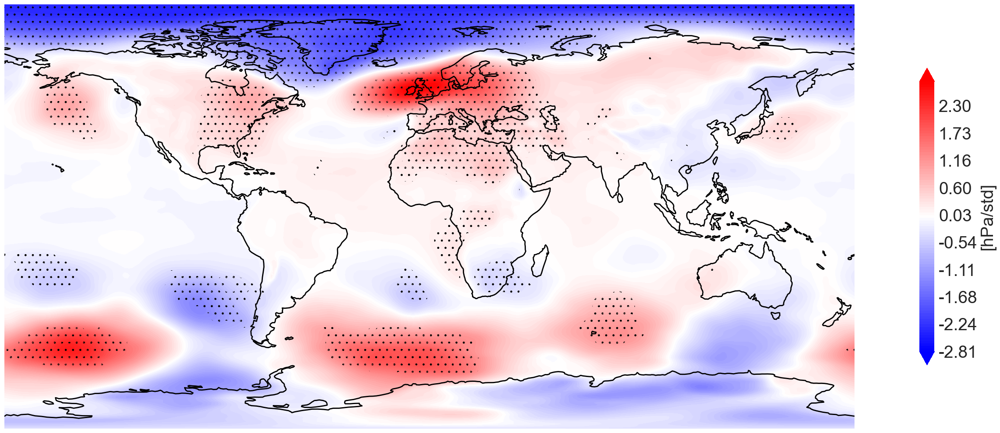

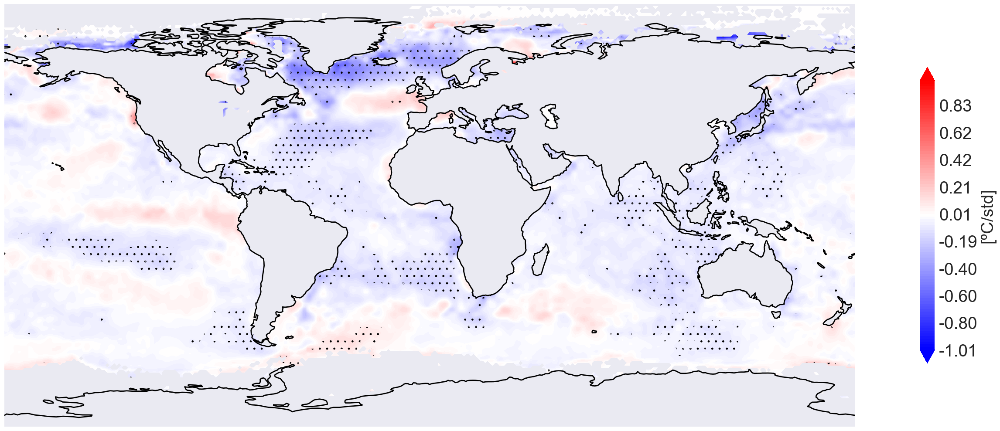

In [ ]:
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = max((abs(np.nanmin(reg_slp)),abs(np.nanmax(reg_slp))))
dibujo_1_mapa_cartopy(np.reshape(reg_slp,(nlat_slp,nlon_slp)),longitud_slp,latitud_slp,np.linspace(-rang,+rang,100),'bwr','[hPa/std]','Mapa de regresión con SLP en Julio', ax)
ax.contourf(longitud_slp,latitud_slp,np.reshape(reg_sig_slp,(nlat_slp,nlon_slp)),alfa=0,cmap='bwr',levels=np.linspace(-rang,+rang,100),hatches='.')
plt.tight_layout()
plt.savefig('Mapa de regresión con SLP en Julio.png')

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = max((abs(np.nanmin(reg_sst_final)),abs(np.nanmax(reg_sst_final))))
dibujo_1_mapa_cartopy(np.reshape(reg_sst_final,(nlat_sst,nlon_sst)),longitud_sst,latitud_sst,np.linspace(-rang,+rang,100),'bwr','[ºC/std]','Mapa de regresión con SST en Julio', ax)
ax.contourf(longitud_sst,latitud_sst,np.reshape(reg_sig_sst_final,(nlat_sst,nlon_sst)),alfa=0,cmap='bwr',levels=np.linspace(-rang,+rang,100),hatches='.')
plt.tight_layout()
plt.savefig('Mapa de regresión con SST en Julio.png')

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\1033717544.py:57: RuntimeWarning: invalid value encountered in divide
  rho = upper / lower
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


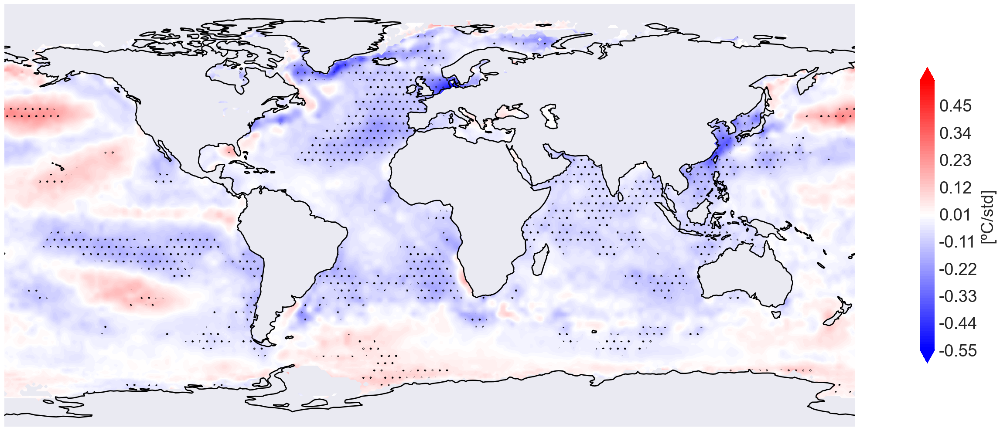

In [ ]:
path_sst= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Practica 1/Datos/HadISST1_sst_1870-2019.nc'
sst= xr.open_dataset(path_sst)
sst_red= sst.sel(time=slice('1960','2010'))

#ahora seleccionamos el mes de julio para la sst y su anomalías (NO estandarizadas)
sst_primavera= (sst_red.groupby('time.season')['MAM']).groupby('time.year').mean()
sst_primavera= (sst_primavera-sst_primavera.mean('year'))

data_sst= sst_primavera.sst
latitud_sst= sst_primavera.latitude
longitud_sst= sst_primavera.longitude
#Añadimos un punto de longitud para que no quede una línea blanca en 0º cuando dibujemos los campos
data_sst, longitud_sst = add_cyclic_point(data_sst, coord=longitud_sst)
nt_sst,nlon_sst,nlat_sst= data_sst.shape

data_reshape_sst= np.reshape(np.array(data_sst),(nt_sst,nlat_sst*nlon_sst))
#tenemos que quitar los nans (mar) para que funcione la función de correlación correctamente
data_sinnans_sst= quitonans(data_reshape_sst)
cor_sst,Pvalue_sst,cor_sig_sst,reg_sst,reg_sig_sst=IndexRegrCorr(np.transpose(data_sinnans_sst),indice_a_correlacionar,0.05,'MonteCarlo',100)

#ponemos los nans de nuevo para la sst
reg_sst_final= pongonans(reg_sst,data_reshape_sst)
#reg_sig_sst_final= pongonans(reg_sig_sst,data_reshape_sst)
Pvalue_sst= pongonans(Pvalue_sst,data_reshape_sst)
reg_sig_sst_final = ma.masked_where(Pvalue_sst<(1-0.05),reg_sst_final)

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = max((abs(np.nanmin(reg_sst_final)),abs(np.nanmax(reg_sst_final))))
dibujo_1_mapa_cartopy(np.reshape(reg_sst_final,(nlon_sst,nlat_sst)),longitud_sst,latitud_sst,np.linspace(-rang,+rang,100),'bwr','[ºC/std]','Mapa de regresión con SST en Primavera', ax)
ax.contourf(longitud_sst,latitud_sst,np.reshape(reg_sig_sst_final,(nlon_sst,nlat_sst)),alfa=0,cmap='bwr',levels=np.linspace(-rang,+rang,100),hatches='.')
plt.tight_layout()
plt.savefig('Mapa de regresión con SST en Primavera.png')

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\1033717544.py:57: RuntimeWarning: invalid value encountered in divide
  rho = upper / lower
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


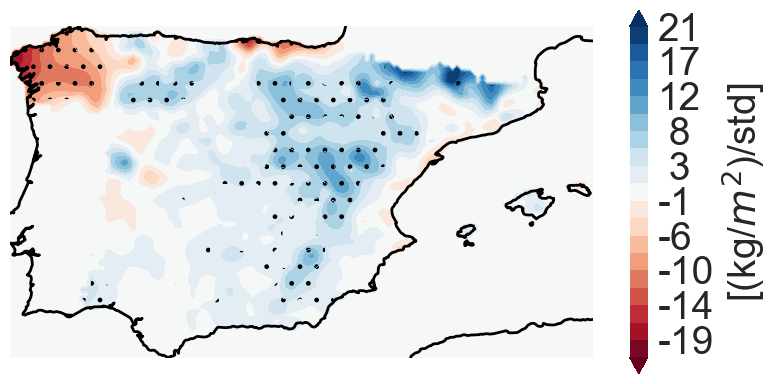

In [116]:
def dibujo_1_mapa_cartopy(A,lon,lat,levs,cmap1,l1,titulo, ax):
    im=ax.contourf(lon,lat,A
                   ,cmap=cmap1,levels=levs,extend='both',transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=2);
    #ax.set_title(titulo,fontsize=28)
    cbar = plt.colorbar(im, extend='neither', spacing='proportional',
                orientation='vertical', shrink=0.7, format="%2.0f")
    cbar.set_label(l1, size=28)
    cbar.ax.tick_params(labelsize=28) 
    
path_precip= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Tema 5/Datos ej clase/Spain02_v5.0_DD_010reg_aa3d_pr.nc'
precip= xr.open_dataset(path_precip)/10
precip_red= precip.sel(time=slice('1960','2010'))

#ahora seleccionamos el mes de julio para la sst y su anomalías (NO estandarizadas)
precip_julio= (precip_red.groupby('time.month')[7]).groupby('time.year').sum()
precip_julio= (precip_julio-precip_julio.mean('year'))

#Como la base de datos de precipitación en España solo va desde 1971, tenemos que coger el índice desde presión desde entonces
indice_red_desde1970= indice_a_correlacionar[11:]

data_precip= precip_julio.pr
latitud_precip= precip_julio.lat
longitud_precip= precip_julio.lon
#Añadimos un punto de longitud para que no quede una línea blanca en 0º cuando dibujemos los campos
#data_sst, longitud_sst = add_cyclic_point(data_sst, coord=longitud_sst) #aquí no hace falta
nt_precip,nlon_precip,nlat_precip= data_precip.shape

data_reshape_precip= np.reshape(np.array(data_precip),(nt_precip,nlat_precip*nlon_precip))
#tenemos que quitar los nans (mar) para que funcione la función de correlación correctamente
data_sinnans_precip= quitonans(data_reshape_precip)
cor_precip,Pvalue_precip,cor_sig_precip,reg_precip,reg_sig_precip=IndexRegrCorr(np.transpose(data_sinnans_precip),indice_red_desde1970,0.05,'MonteCarlo',100)

#ponemos los nans de nuevo para la sst
reg_precip_final= pongonans(reg_precip,data_reshape_precip)
#reg_sig_precip_final= pongonans(reg_sig_precip,data_reshape_precip)
Pvalue_precip= pongonans(Pvalue_precip,data_reshape_precip)
reg_sig_precip_final = ma.masked_where(Pvalue_precip<(1-0.05),reg_precip_final)

fig = plt.figure() 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = max((abs(np.nanmin(reg_precip_final)),abs(np.nanmax(reg_precip_final))))
dibujo_1_mapa_cartopy(np.reshape(reg_precip_final,(nlon_precip,nlat_precip)),longitud_precip,latitud_precip,np.linspace(-rang,+rang,20),'RdBu','[(kg/$m^2$)/std]','Mapa de regresión con Precipitación en Julio', ax)
ax.contourf(longitud_precip,latitud_precip,np.reshape(reg_sig_precip_final,(nlon_precip,nlat_precip)),alfa=0,cmap='RdBu',levels=np.linspace(-rang,+rang,20),hatches='.')
plt.tight_layout()
plt.savefig('Mapa de regresión con Precipitacion en Julio.png')

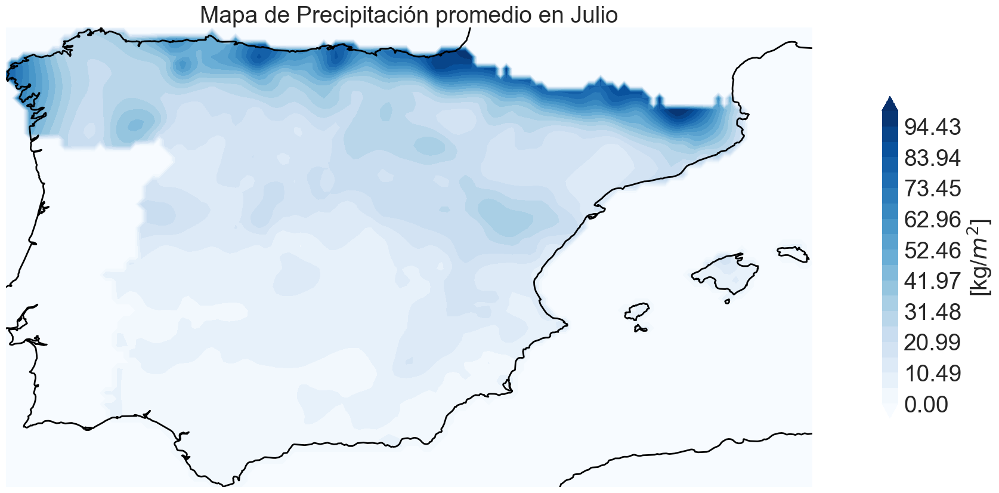

In [116]:
path_precip= 'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Tema 5/Datos ej clase/Spain02_v5.0_DD_010reg_aa3d_pr.nc'
precip= xr.open_dataset(path_precip)/10
precip_red= precip.sel(time=slice('1960','2010'))

#ahora seleccionamos el mes de julio para la precipitación y su anomalías (NO estandarizadas)
precip_julio_promedio= np.array((precip_red.groupby('time.month')[7]).groupby('time.year').sum().mean(dim='year').pr)
fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = np.nanmax(precip_julio_promedio)
dibujo_1_mapa_cartopy(np.reshape(precip_julio_promedio,(nlon_precip,nlat_precip)),longitud_precip,latitud_precip,np.linspace(0,+rang,20),'Blues','[kg/$m^2$]','Mapa de Precipitación promedio en Julio', ax)

Lo siguiente que vamos a hacer es usar alguno de los índices de extremos que hemos visto y ver cómo se correlaciona con el índice de presión que hemos tomado característico de la ola de calor de Julio de 2022. El índice que vamos a utilizar es el del número de días cálidos, que son aquellos donde la temperatura máxima fue superior a la del percentil 90 de temperaturas máximas (Tx90p), es decir:
<img src="indice.png" width="500" height=10000>


In [119]:
plt.style.use('seaborn')
max_data_red= maximas_julio.tx

cuantil_max= np.quantile(max_data_red,0.9,axis=0)

n_hot_days_july= np.zeros(51)

latitud_diascalidos= max_data_red.lat
longitud_diascalidos= max_data_red.lon
n_hot_days_per_pixel_july= np.empty((51,len(latitud_diascalidos),len(longitud_diascalidos)))

s=0
for i in range(1960,2011):
    a_1= np.sum(np.where(max_data_red[max_data_red['Time.year']==i]>cuantil_max,1,0),axis=0)
    n_hot_days_july[s]= np.nanmean(np.where(np.isnan(max_data_red[max_data_red['Time.year']==i]),np.nan,a_1))
    a_1= np.where(np.isnan(np.mean(max_data_red[max_data_red['Time.year']==i],axis=0)),np.nan,a_1) #le pongo que solo coja el mean para que me quite todos los nans
    n_hot_days_per_pixel_july[s,:,:]= a_1
    s +=1
    
pecentage_hot_days_july= n_hot_days_july*100/31
indice_dias_calidos_estandarizado= (pecentage_hot_days_july-np.mean(pecentage_hot_days_july))/np.std(pecentage_hot_days_july)

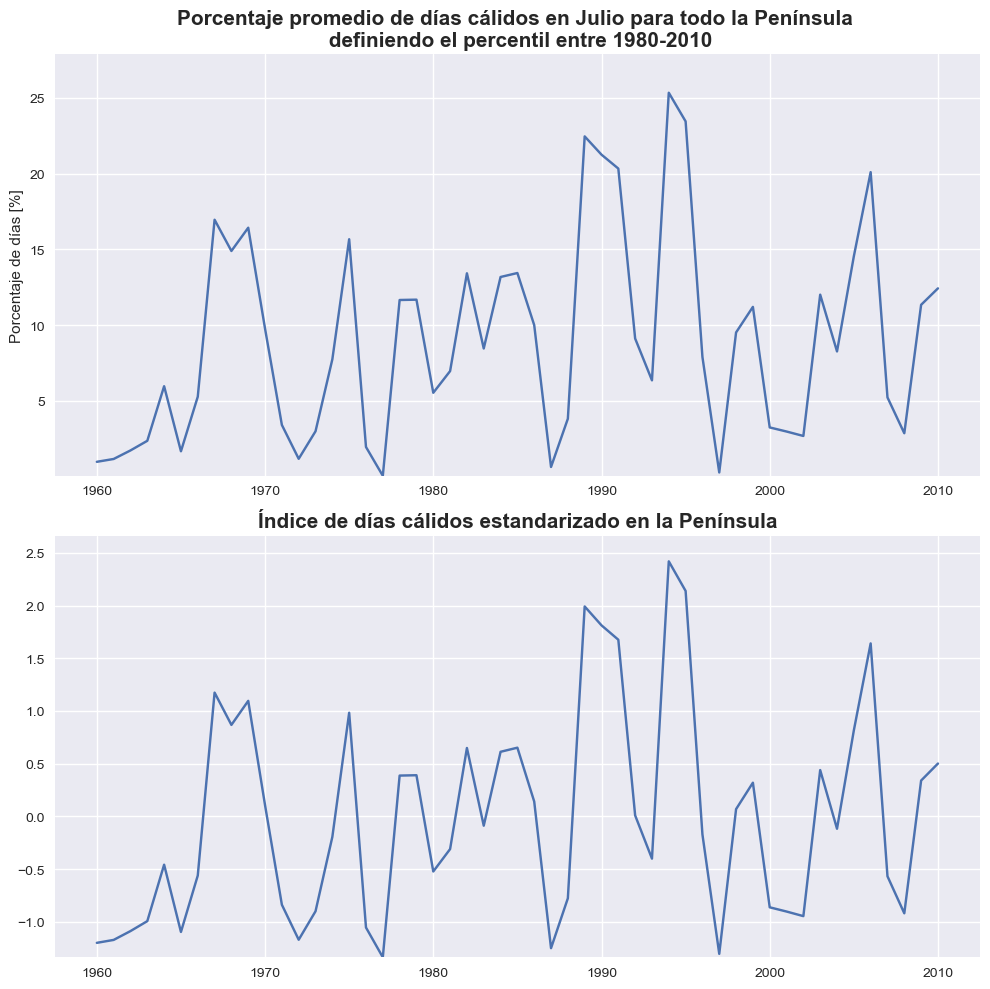

In [120]:
fig = plt.figure(figsize=(10,10), tight_layout=True) 
ax1 = fig.add_subplot(211)

period= np.arange(1960,2011,1)
ax1.plot(period,pecentage_hot_days_july)
maximo_night= 1.1*np.max(pecentage_hot_days_july)
minimo_night= np.min(pecentage_hot_days_july)
ax1.set_ylim(minimo_night,maximo_night)
ax1.set_title('Porcentaje promedio de días cálidos en Julio para todo la Península \n definiendo el percentil entre 1980-2010',fontsize=15, weight='bold')
ax1.set_ylabel('Porcentaje de días [%]')
ax2 = fig.add_subplot(212)
ax2.plot(period,indice_dias_calidos_estandarizado)
maximo_night= 1.1*np.max(indice_dias_calidos_estandarizado)
minimo_night= np.min(indice_dias_calidos_estandarizado)
ax2.set_ylim(minimo_night,maximo_night)
ax2.set_title('Índice de días cálidos estandarizado en la Península',fontsize=15, weight='bold')
plt.tight_layout()
plt.savefig('Porcentaje promedio de días cálidos en Julio.png')

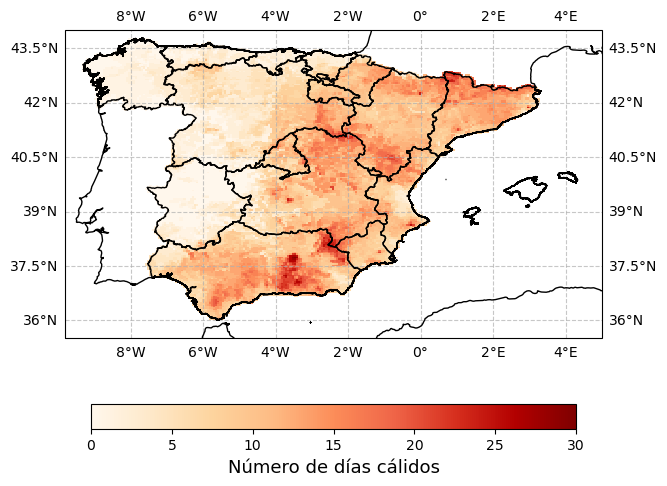

In [138]:
plt.style.use('default')
  
# Para pintar los bordes de las comunidades autónomas se utilizan datos de https://gadm.org/download_country.html
fname = 'Datos/mapas/gadm41_ESP_1.shp'
adm1_shapes = list(shpreader.Reader(fname).geometries())

year= 1994
# Creamos la figura
fig, ax = plt.subplots(figsize=(10, 5), ncols=1)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
#plt.suptitle('Número de días cálidos en '+str(year),size=22)

# A partir de aquí vamos a pintar los valores promedio de noches frías en el periodo empleado   
cmap = 'OrRd'
years= period
var = n_hot_days_per_pixel_july[np.where(years==year)[0],:,:].squeeze()
latitud= max_data_red.lat
longitud= max_data_red.lon
im = ax.pcolormesh(longitud,latitud,var,cmap=cmap,vmin=0, vmax=30, transform =ccrs.PlateCarree()) # En transform se pone la proyección default en la que están los datos 

#print(var.max().squeeze())

# Pintamos las líneas de costa y las fronteras de comunidades
ax.coastlines(resolution='10m')
ax.add_geometries(adm1_shapes, ccrs.PlateCarree(), # Cuidado con los sistemas de coordenadas, esto esta definido solo para este sistema
                  edgecolor='black', facecolor='None', alpha=1)
ax.set_global() 
ax.gridlines(draw_labels = True,linestyle='--',alpha=0.7,zorder=1) # Añadimos ejes
ax.set_extent([-9.8,5,35.5,44], ccrs.PlateCarree()) # Fijamos los límites del plot


# Barra de color 
cbar = fig.colorbar(im,ax=ax,orientation = 'horizontal',shrink=0.5) 
cbar.set_label(label='Número de días cálidos',size=13)
cbar.ax.set_xlim(0, 30) # Al poner los mismos vmin y vmax aseguramos que la escala sea consistente en cada parte

plt.tight_layout()
plt.savefig('Número de días cálidos en '+str(year)+'.png')

Vamos ahora a correlacionar el índice de días cálidos y el de presión
(en la siguiente celda tenemos la función de regresión lineal)

In [122]:
def regresLinSim(x,y,titulo,xlabel,ylabel):
    alpha = 0.05
    x = np.squeeze(np.array(x))
    y = np.squeeze(np.array(y))
    N = x.size
    xm = x.mean()
    ym = y.mean()
    SXY = np.sum(x * y) - N * xm * ym
    SXX = np.sum(x * x) - N * xm * xm
    SYY = np.sum(y * y) - N * ym * ym
    SSR = SXY ** 2 / SXX 
    a1 = SXY / SXX
    a0 = ym - xm * a1
    yhat =  a0 + a1 * x
    e = y - yhat
    R2 = SSR / SYY
    SSE = SYY - SSR
    rho = SXY / np.sqrt(SXX*SYY)
    Se = np.sqrt( SSE / (N - 2 ) )
    t = stats.t.ppf(1-alpha/2,N-2)
    IC_a1 = a1 + np.array([-1, 1]) * t * Se / np.sqrt(SXX)
    IC_a0 = a0 + np.array([-1, 1]) * t * Se * np.sqrt(np.sum(x*x)/N/SXX)
    xvec = np.linspace(x.min(),x.max(),100)
    muY = ym + a1 * (xvec - xm) 
    AmuY = t * Se * np.sqrt(1/N + (xvec-xm) * (xvec -xm) /SXX)
    AY = t * Se * np.sqrt( 1 + 1/N + (xvec-xm) * (xvec -xm) /SXX)
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    ax[0].plot(x,y,'.')
    ax[0].grid()
    ax[0].plot(xvec,muY+AmuY,color='orange')
    ax[0].plot(xvec,muY-AmuY,color='orange')
    ax[0].plot([x.min(), x.max()],[a0+a1*x.min(), a0+a1*x.max()],'r')
    ax[0].plot(xvec,muY+AY,color='k')
    ax[0].plot(xvec,muY-AY,color='k')
    ax[0].set_title('Simple Linear Regression')
    ax[0].set_ylabel('y='+str(ylabel))
    ax[0].set_xlabel('x='+str(xlabel))
    ax[0].text(0.5,0.05,'a0=[%.3f,%.3f]'%(IC_a0[0],IC_a0[1]), transform=ax[0].transAxes)
    ax[0].text(0.5,0.1,'a1=[%.3f,%.3f]'%(IC_a1[0],IC_a1[1]), transform=ax[0].transAxes)
    ax[0].text(0.5,0.15,'rho=%.2f'%(rho), transform=ax[0].transAxes)
    ax[1].plot(yhat,e/Se,'.')
    ax[1].grid()
    ax[1].set_xlabel(r'$\hat{y}$')
    ax[1].set_ylabel(r'$\hat{e}/\sigma_E$')
    ax[1].set_title('Standardized residuals')
    fig.suptitle(titulo,size=15,weight='bold')
    return a1, a0, rho, IC_a1, IC_a0, muY, AmuY, AY

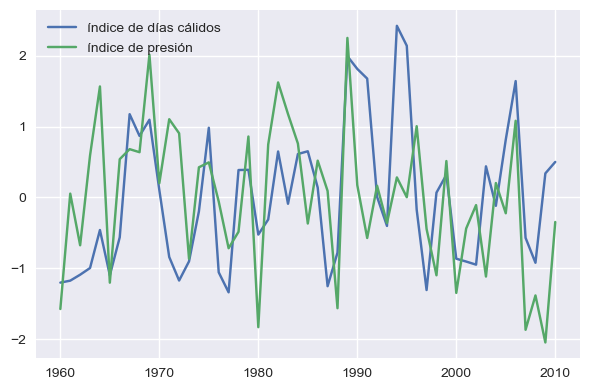

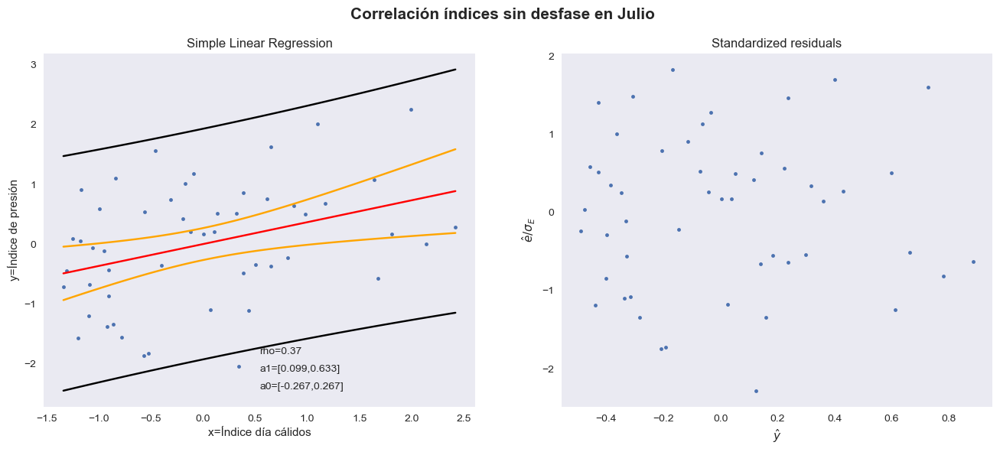

In [127]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(6,4), tight_layout=True) 
ax1 = fig.add_subplot(111)

period= np.arange(1960,2011,1)
ax1.plot(period,indice_dias_calidos_estandarizado,label='índice de días cálidos')
ax1.plot(period,correlacion_estandarizado,label='índice de presión')
ax1.legend()
#ax1.set_title('Comparación índices',fontsize=15, weight='bold')
plt.savefig('indice_presion_vs_indice_dias_calidos.png')
a1, a0, rho, IC_a1, IC_a0, muY, AmuY, AY = regresLinSim(indice_dias_calidos_estandarizado,correlacion_estandarizado,'Correlación índices sin desfase en Julio',ylabel='Índice de presión', xlabel='Índice día cálidos')

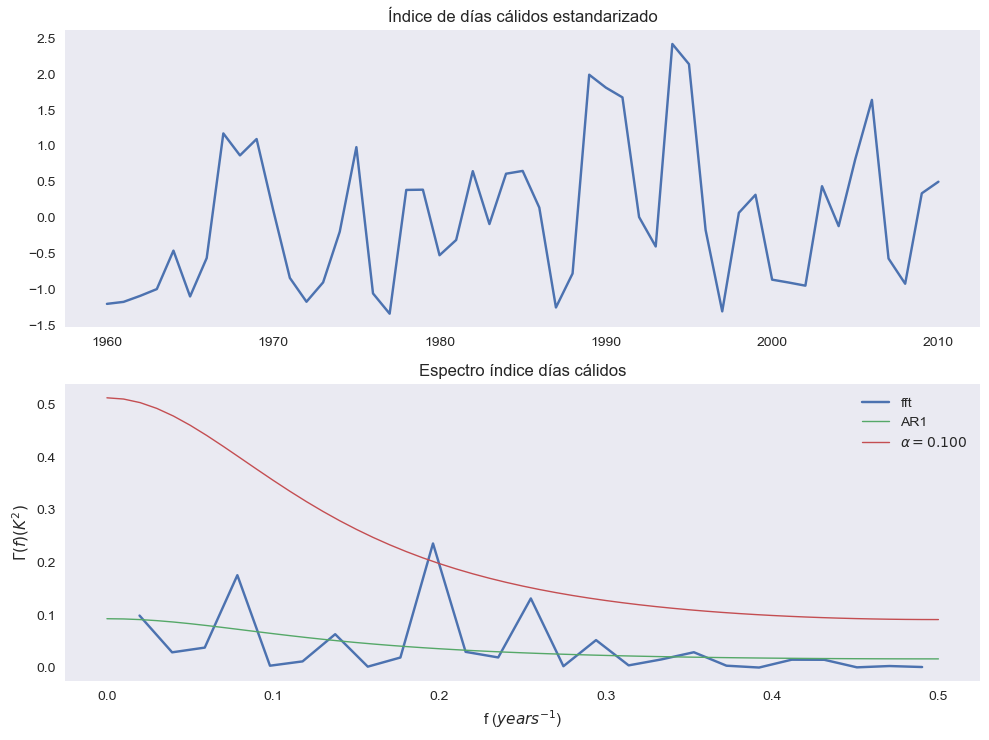

In [128]:
julio= np.array(indice_dias_calidos_estandarizado)

time= period
x_day=julio

fig,((ax0,ax1))=plt.subplots(2,1,figsize=(10,7.5),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Índice de días cálidos estandarizado')

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro índice días cálidos')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.1
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=1,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()


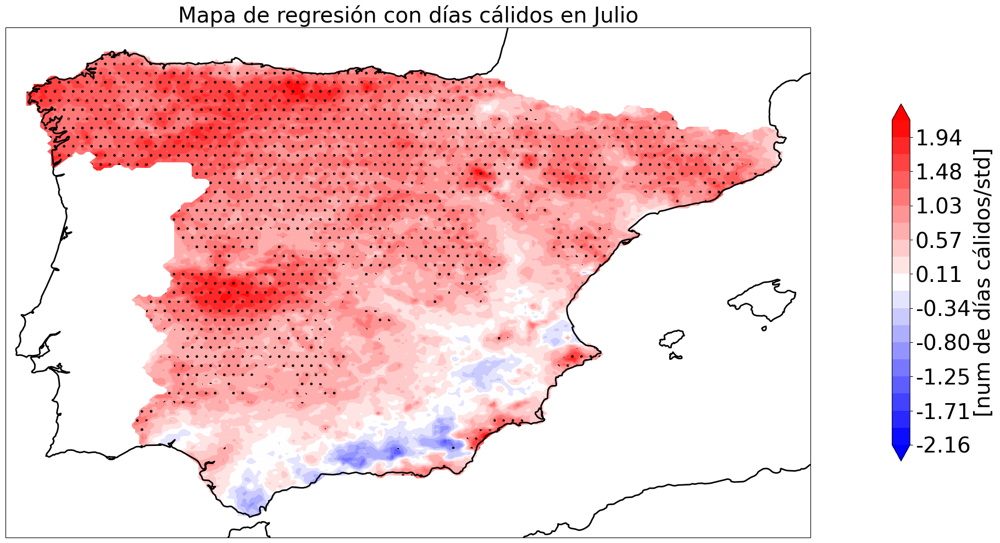

In [213]:
#Ahora vamos a hacer un mapa de regresión de nuestro índice de presión con el mapa de número de días cálidos
latitud= latitud_diascalidos
longitud= longitud_diascalidos
nt_dias,nlat_dias,nlon_dias= n_hot_days_per_pixel_july.shape
campo= n_hot_days_per_pixel_july-np.mean(n_hot_days_per_pixel_july,axis=0)
data_reshape_dias= np.reshape(np.array(campo),(nt_dias,nlat_dias*nlon_dias))
#tenemos que quitar los nans (mar) para que funcione la función de correlación correctamente
data_sinnans_dias= quitonans(data_reshape_dias)
cor_dias,Pvalue_dias,cor_sig_dias,reg_dias,reg_sig_dias=IndexRegrCorr(np.transpose(data_sinnans_dias),indice_a_correlacionar,0.05,'MonteCarlo',100)

#ponemos los nans de nuevo para los dias
reg_dias_final= pongonans(reg_dias,data_reshape_dias)
Pvalue_dias= pongonans(Pvalue_dias,data_reshape_dias)
reg_sig_dias_final = ma.masked_where(Pvalue_dias<(1-0.05),reg_dias_final)

fig = plt.figure(figsize=(30,10)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree(0))
rang = max((abs(np.nanmin(reg_dias_final)),abs(np.nanmax(reg_dias_final))))
dibujo_1_mapa_cartopy(np.reshape(reg_dias_final,(nlat_dias,nlon_dias)),longitud,latitud,np.linspace(-rang,+rang,20),'bwr','[num de días cálidos/std]','Mapa de regresión con días cálidos en Julio', ax)
ax.contourf(longitud,latitud,np.reshape(reg_sig_dias_final,(nlat_dias,nlon_dias)),alfa=0,cmap='bwr',levels=np.linspace(-rang,+rang,20),hatches='.')
plt.tight_layout()
plt.savefig('Mapa de regresión con días cálidos en Julio.png')

A continuación, atendiendo al mapa de anomalías de SLP de Julio de 2022, veamos si en el periodo 1960-2010 se ha tenido algún otro episodio, para ello, usamos el índice que hemos calculado correlacionando el mapa de anomalías de SLP en julio de 2022 con las anomalías de SLP de la base de datos ERA20 para los julios entre 1960 y 2010. Vemos un claro pico en 1989 (para todos los índices de presión), vamos a reconstruir el mapa de presión a partir de este valor del índice

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_33404\4029579803.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "fpi" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(nombre,fpi=300)


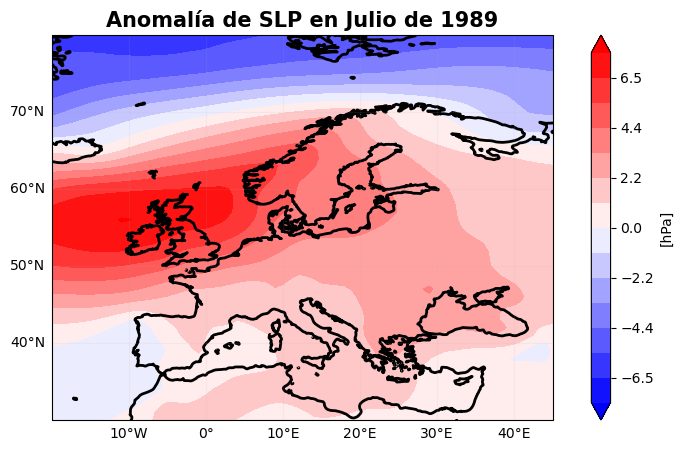

In [141]:
valor_maximo= np.max(correlacion_estandarizado)
año_maximo= years[np.where(correlacion_estandarizado==valor_maximo)[0]][0]
#año_maximo= 1994 #año con ola importante de calor pero con otro patrón de presión

anomalia_slp_year= anom_era_slp_julio.sel(time=str(año_maximo))
anomalia_slp_year_2= np.array(anomalia_slp_year.msl.squeeze())
longitud= anomalia_slp_year.longitude
latitud= anomalia_slp_year.latitude
plt.style.use('default')
fig = plt.figure(figsize=(10,5)) 
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
maximo= np.max((abs(np.min(anomalia_slp_year_2)),abs(np.max(anomalia_slp_year_2))))
levels1 = np.round(np.linspace(-maximo,+maximo,num=15),decimals=1)
im=ax.contourf(longitud,latitud,anomalia_slp_year_2,cmap='bwr',levels=levels1,extend='both',transform=ccrs.PlateCarree())
ax.coastlines(linewidth=2)
ax.set_title('Anomalía de SLP en Julio de '+str(año_maximo),fontsize=15,weight='bold')
gl=ax.gridlines(draw_labels = True, alpha=0.1)
gl.ylabels_right = False
gl.xlabels_top = False
fig.colorbar(im,ax=ax,label='[hPa]')
nombre='Anomalía de SLP en Julio de '+str(año_maximo)+' con regiones indices.png'
plt.savefig(nombre,fpi=300)
plt.show()


En este último apartado vamos a aplicar análisis de componentes principales, concretamente, vamos a hacer las EOFs de los días cálidos y correlacionarla con el índice de presión

In [215]:
# elección de años comunes
yrs = list(range(1960, 2011)) # len(yrs) = 111

nmes = 1

#calculamos las anomalías de días cálidos por pixel para hacer la MCA
z= n_hot_days_per_pixel_july-np.mean(n_hot_days_per_pixel_july,axis=0)
nt,nlat,nlon= z.shape
z_antes= np.reshape(np.array(z),(nt,nlat*nlon))
z= np.transpose(quitonans(z_antes))

y= anom_era_slp_julio.msl
nt,nlat,nlon= y.shape
y_antes= np.transpose(np.reshape(np.array(y),(nt,nlat*nlon)))
y= quitonans(y_antes)

In [126]:
def MCA(Z,Y,nmes,nm,meth,alfa,sig,perm):
    # Z: campo a predecir
    # Y: campo predictor
    # datos con dimensiones ns, nt
    # nm: numero de modos
    # nmes: meses por año, si es media estacional es 1, pero si es enero y feb
    # por separado es 2
    # meth: metodología
    # Y1, Z1: campos sobre los que proyecto los resultados, 
    #que pueden ser para un espacio mayor que en Z e Y
    
    nz,nt=Z.shape
    ny,nt=Y.shape
    nyr=int(nt/nmes)
    # matriz de covarianza
    if  meth=='MCA':
        C=np.dot(Y,np.transpose(Z))
    
    if  meth =='CCA': # matriz de covarianza
        iSYY=inv(np.dot(Y,np.transpose(Y)))
        SYZ=np.dot(Y,np.transpose(Z))
        iSZZ=inv(np.dot(Z,np.transpose(Z)))
        SZY=np.dot(Z,np.transpose(Y))
        C=np.dot(np.dot(iSYY,SYZ), np.dot(iSZZ,SZY))
    
    R,d,Q=linalg.svd(C)
    scf=d/np.sum(d) # fraccion de covarianza explicada

    # coefs de expansión, protectamos sobre los primeros nm 
    # obtenemos unas series temporales
    U=np.dot(np.transpose(Y),R[:,:nm])
    V=np.dot(np.transpose(Z),Q[:,:nm])
    
    # coefs de expansión estandarizados
    # estandarizamos esas series temporales
    Us = anom(np.transpose(U),nyr,'st')
    Vs = anom(np.transpose(V),nyr,'st')
    
    # mapas de regresión en ambos casos se usa U y no V !! (serie temporal U)
    RUY = ma.empty([ny,nm]);pvalruy=ma.empty([ny,nm]);RUY_sig=ma.empty([ny,nm]);SUY=ma.empty([ny,nm]);SUY_sig=ma.empty([ny,nm])
    RUZ = ma.empty([nz,nm]);pvalruz=ma.empty([nz,nm]);RUZ_sig=ma.empty([nz,nm]);SUZ=ma.empty([nz,nm]);SUZ_sig=ma.empty([nz,nm])
    
    # proyrctamos los datos sobre los primeros nm autovalores
    for i in range(nm):
        RUY[:,i], pvalruy[:,i], RUY_sig[:,i], SUY[:,i], SUY_sig[:,i]=IndexRegrCorr(Y,Us[i,:],alfa,sig,perm)
        RUZ[:,i], pvalruz[:,i], RUZ_sig[:,i], SUZ[:,i], SUZ_sig[:,i]=IndexRegrCorr(Z,Us[i,:],alfa,sig,perm)
    
    # MAPA DE CORRELACION SOBRE Y Y Z
    return RUY, RUY_sig, SUY, SUY_sig, RUZ, RUZ_sig, SUZ, SUZ_sig, Us, Vs, scf

In [217]:
# cálculo de la mca
RUY, RUY_sig, SUY, SUY_sig, RUZ, RUZ_sig, SUZ, SUZ_sig, Us, Vs, scf = MCA(z,y,nmes,5,'MCA',0.1,'MonteCarlo',100)

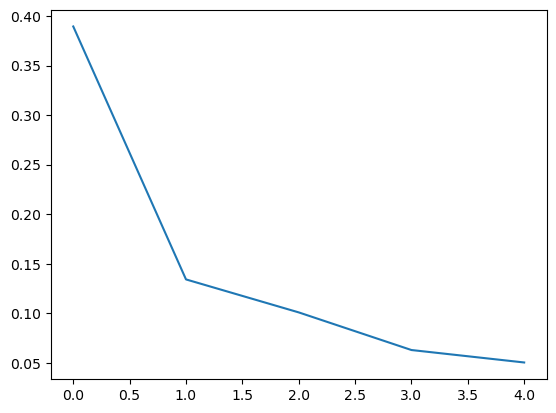

In [218]:
plt.plot(scf[0:5])

C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_15632\3255658079.py:7: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  ax[i].grid(b=True, linestyle ='--')


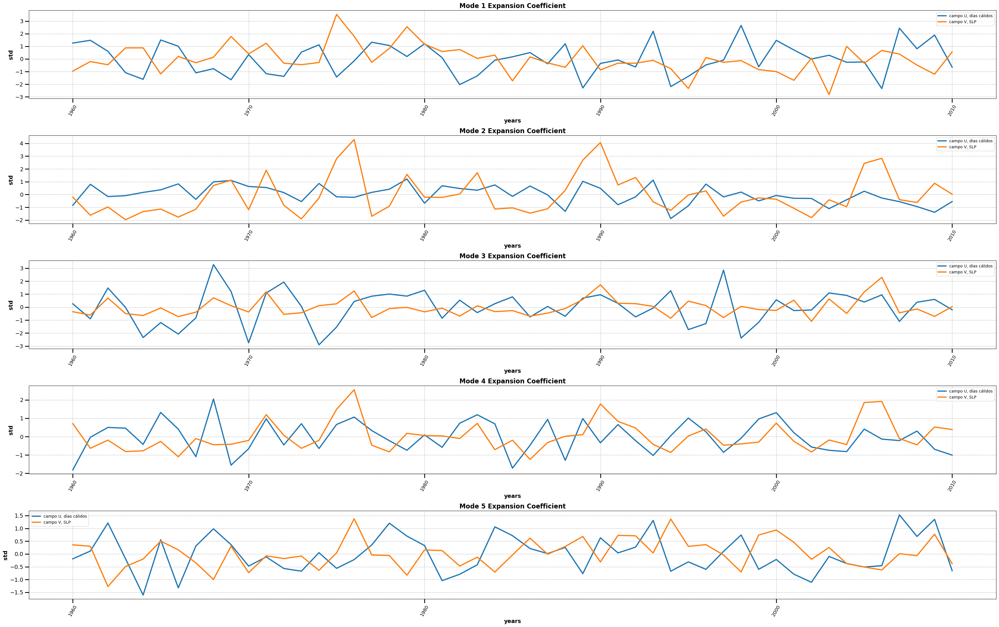

In [219]:
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(35,22)) 
# ax=fig.add_subplot(1, 1, 1)

for i in range(5):
    ax[i].plot(yrs,Us[i,:],  linewidth=3, label = 'campo U, días cálidos')
    ax[i].plot(yrs, Vs[i,:], linewidth=3, label='campo V, SLP')
    ax[i].grid(b=True, linestyle ='--')
    plt.xticks(np.arange(yrs[0],yrs[-1],20))
    ax[i].tick_params('y',labelsize = 14, width = 2, length = 10)
    ax[i].tick_params('x',labelsize = 12, width = 2, length = 10, labelrotation = 60)
    ax[i].legend()
    ax[i].set_title(f'Mode {i+1} Expansion Coefficient', fontsize = 16, weight ='bold')
    ax[i].set_ylabel('std', fontsize = 14, fontweight = 'bold')
    ax[i].set_xlabel('years', fontsize = 14, fontweight = 'bold')
plt.tight_layout()

In [130]:
def dibujo_2_mapas_cartopy_hatches(A,B,lon,lat, levs, cmap1, l1, t1):
    # esto lo hago para añadir los límites de las comunidades
    fname = 'Datos/mapas/gadm41_ESP_1.shp'
    adm1_shapes = list(shpreader.Reader(fname).geometries())

    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(0))
    
    im = ax.contourf(lon,lat,A.reshape(len(lat),len(lon)), 
                     extend='both',cmap=cmap1,levels=levs,transform = ccrs.PlateCarree())

    ax.coastlines(linewidth=2); 
    fig.colorbar(im, ax=ax, label = l1) #Para la barra de colores
    im = ax.contourf(lon,lat,B.reshape(len(lat),len(lon))
                 ,extend='both'
                 ,hatches='.',cmap=cmap1,alfa=0,levels=levs,transform = ccrs.PlateCarree())
    
    #el uso de alfa=0 lo que hace es que solo salgan los puntos y no salgan los colors porque los pones totalmente transparentes
    # si el mapa significativo abarca una región menor suele cortarlo
    # para ello añadimos estos límites
    
    ax.gridlines(draw_labels = True,linestyle='--',alpha=0.7,zorder=1) # añadimos ejes
    ax.add_geometries(adm1_shapes, ccrs.PlateCarree(), # cuidado con los sistemas de coordenadas, esto esta definido solo para este sistema
                  edgecolor='black', facecolor='None', alpha=1)
    ax.set_ylim(lat[-1], lat[0])
    ax.set_xlim(lon[0], lon[-1])

0.3894376452489695


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


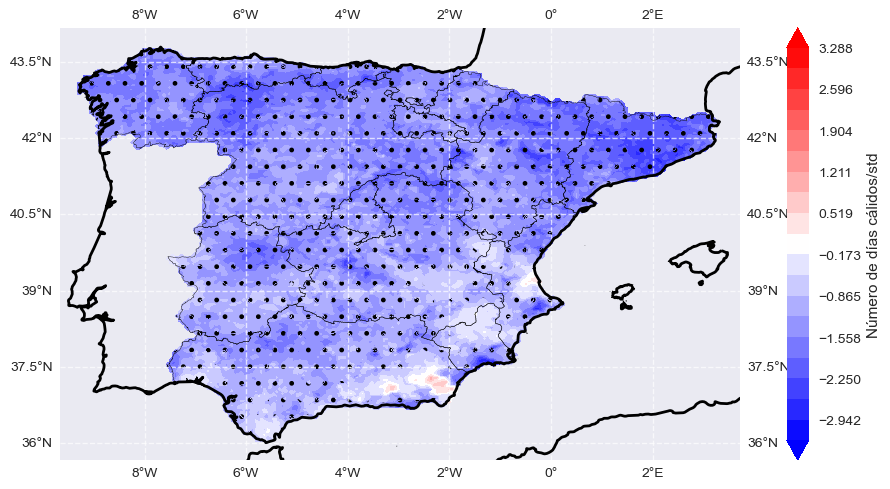

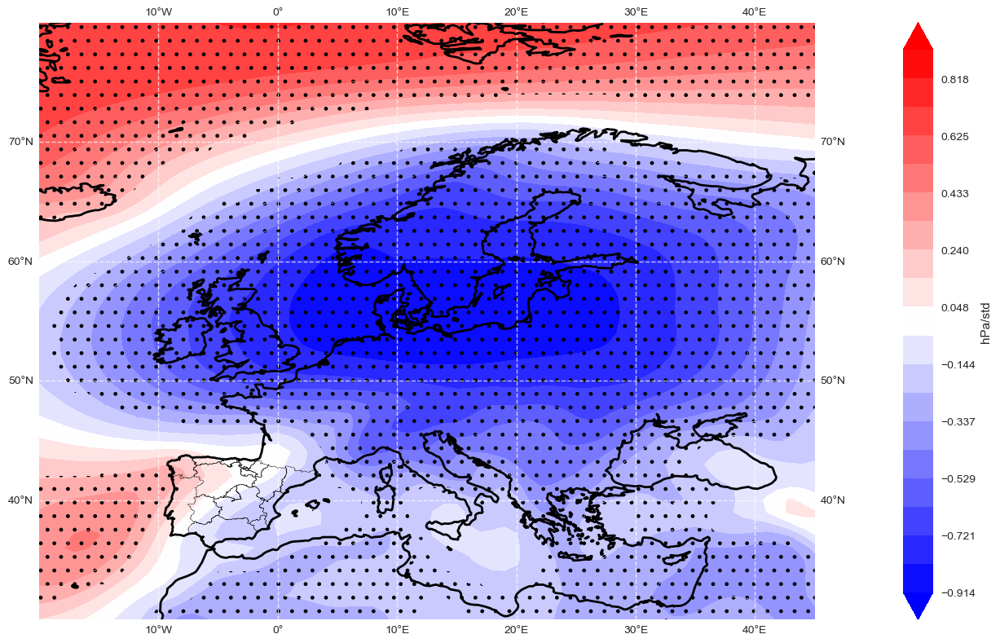

In [230]:
modo = 0
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])
fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,longitud_diascalidos,latitud_diascalidos,np.linspace(-maximo,+maximo,20), 'bwr', 'Número de días cálidos/std','Modo 1 días cálidos')
plt.tight_layout()
plt.savefig('Modo 1 días cálidos con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 11 días cálidos con SLP.png')


0.13423078919708395


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


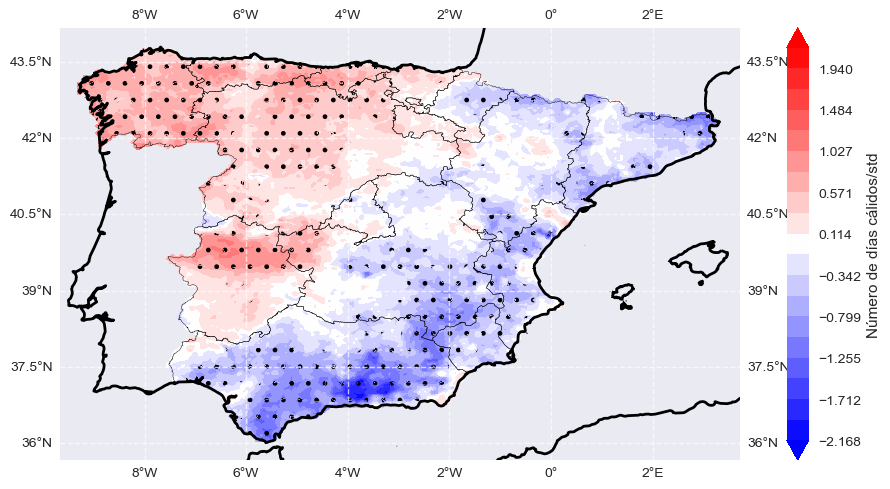

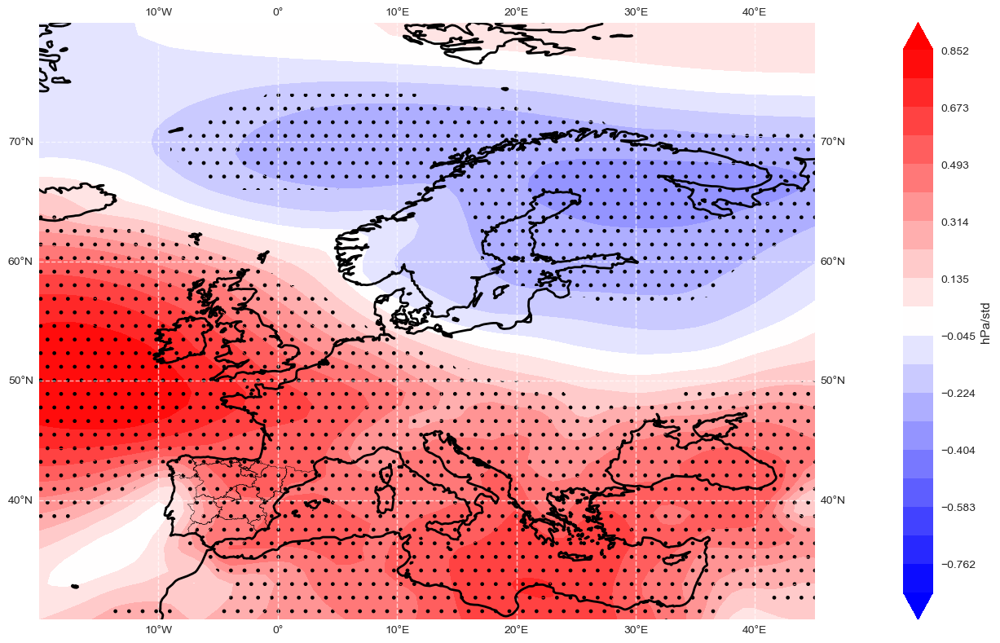

In [231]:
modo = 1
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,longitud_diascalidos,latitud_diascalidos,np.linspace(-maximo,+maximo,20), 'bwr', 'Número de días cálidos/std','Modo 1 días cálidos')
plt.tight_layout()
plt.savefig('Modo 2 días cálidos con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 22 días cálidos con SLP.png')

0.10095514657654552


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


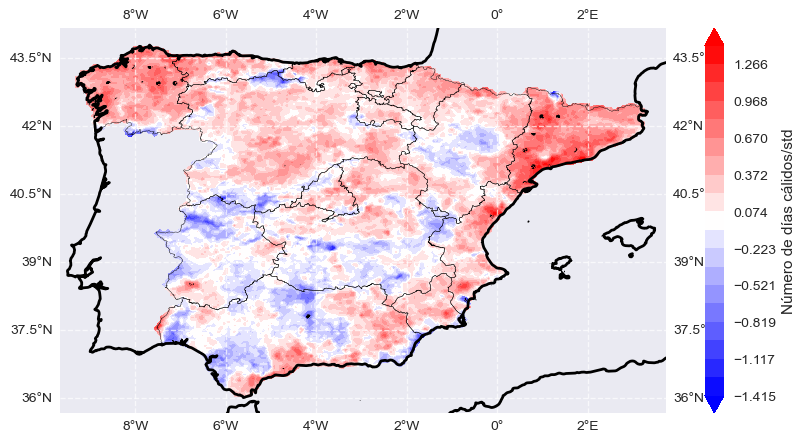

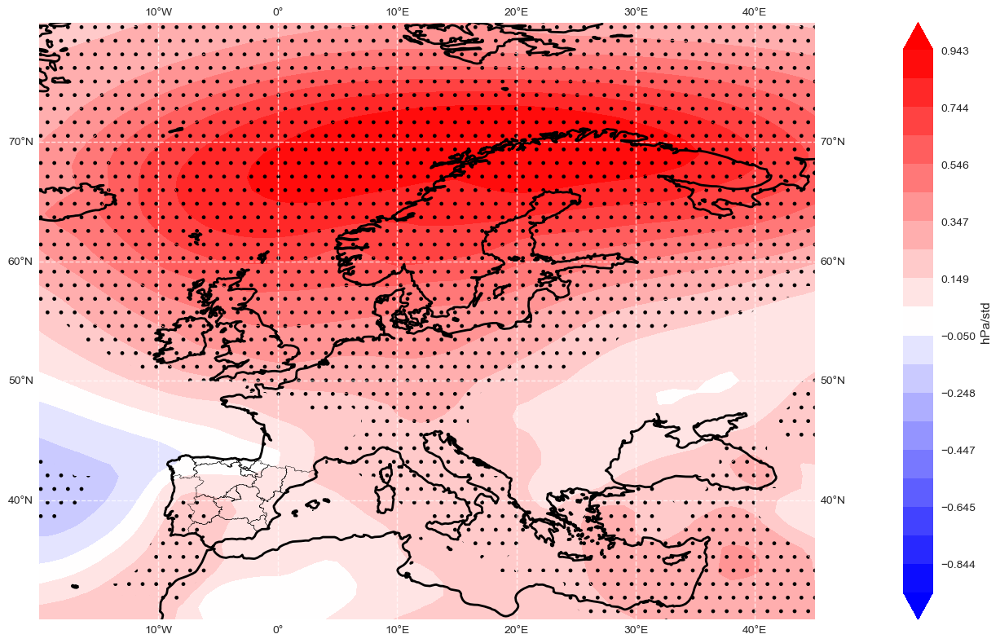

In [232]:
modo = 2
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,longitud_diascalidos,latitud_diascalidos,np.linspace(-maximo,+maximo,20), 'bwr', 'Número de días cálidos/std','Modo 1 días cálidos')
fig = plt.figure(figsize=(22,8)) 
plt.tight_layout()
plt.savefig('Modo 3 días cálidos con SLP.png')
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 33 días cálidos con SLP.png')

0.06298380781041821


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


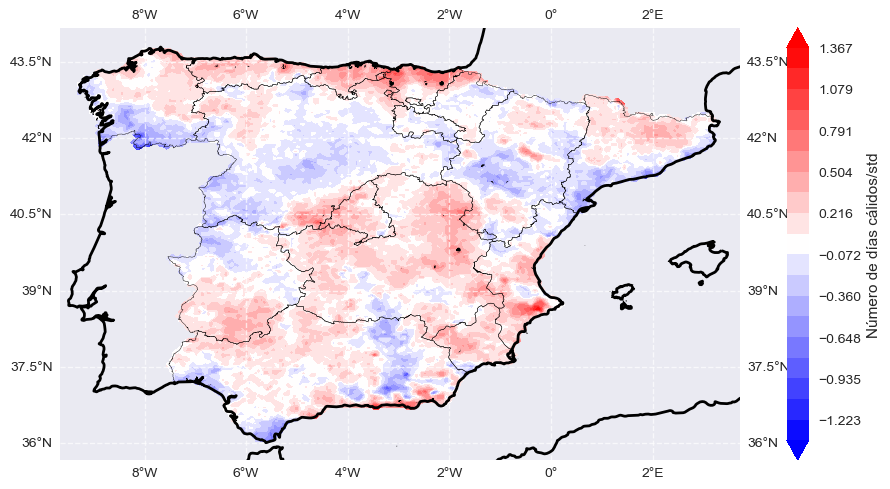

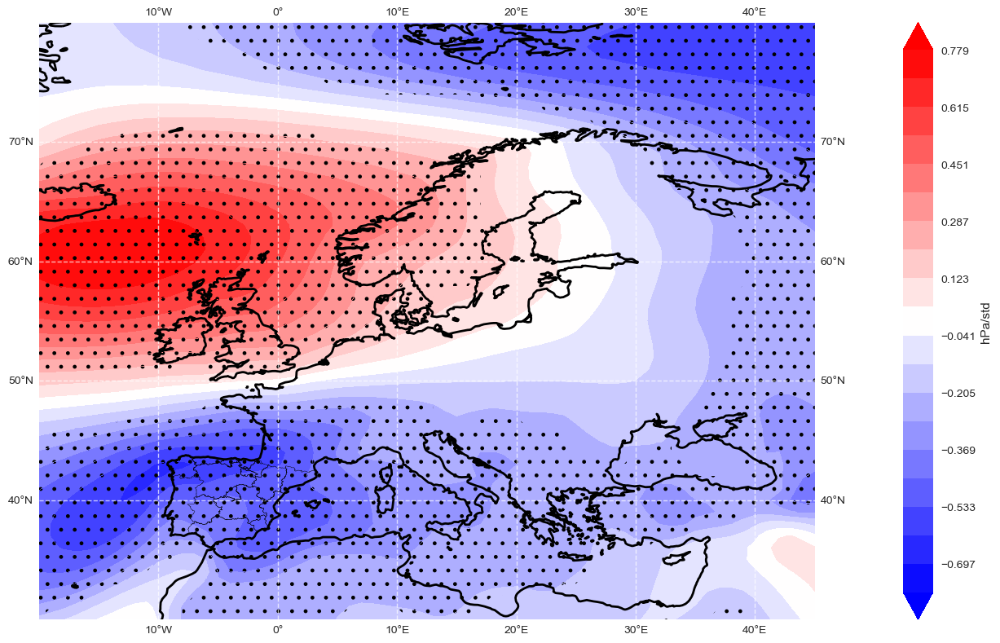

In [233]:
modo = 3
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,longitud_diascalidos,latitud_diascalidos,np.linspace(-maximo,+maximo,20), 'bwr', 'Número de días cálidos/std','Modo 1 días cálidos')
plt.tight_layout()
plt.savefig('Modo 4 días cálidos con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 44 días cálidos con SLP.png')

0.05042167602814806


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


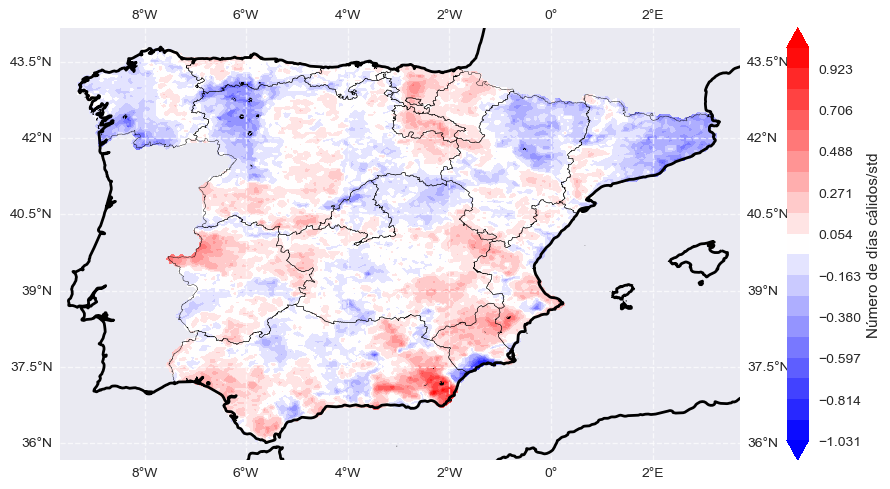

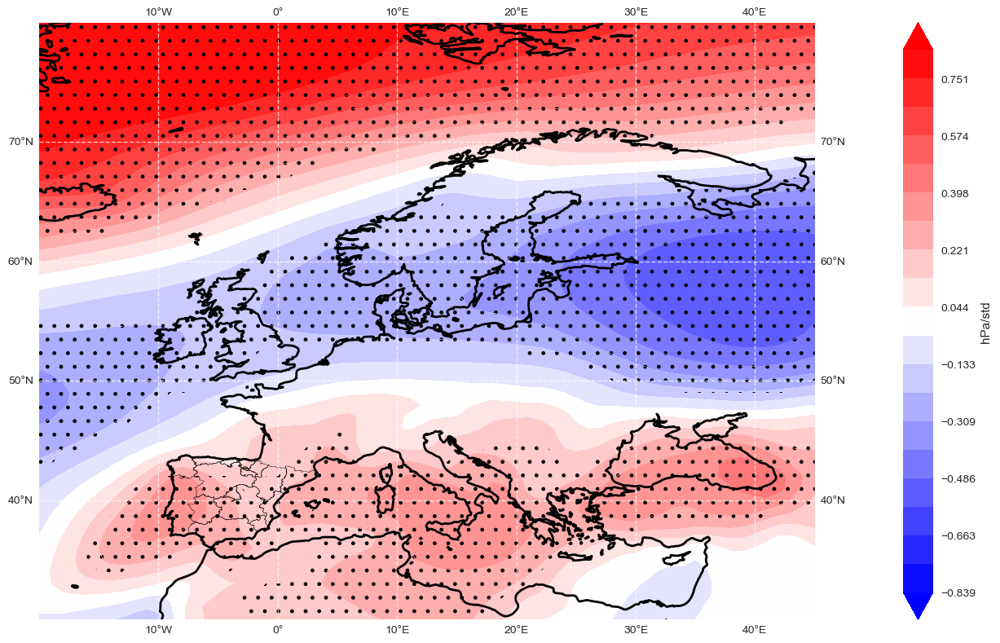

In [234]:
modo = 4
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,longitud_diascalidos,latitud_diascalidos,np.linspace(-maximo,+maximo,20), 'bwr', 'Número de días cálidos/std','Modo 1 días cálidos')
plt.tight_layout()
plt.savefig('Modo 5 días cálidos con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 55 días cálidos con SLP.png')

In [122]:
#Vamos a hacer otro MCA, pero en este caso, para correlacionar el mapa de anomalías de SLP con las anomalías de precipitación
precip_julio= precip_julio.sortby('lat',ascending=False) #para que las latitudes vayan decreciendo y no aumentando (daba problemas)

# elección de años comunes
yrs = list(range(1971, 2011)) # len(yrs) = 111

nmes = 1

#calculamos las anomalías de precipitación por pixel para hacer la MCA
z= precip_julio.pr
nt,nlat,nlon= z.shape
z_antes= np.reshape(np.array(z),(nt,nlat*nlon))
z= np.transpose(quitonans(z_antes))

y= anom_era_slp_julio.sel(time=slice('1971','2010')).msl
nt,nlat,nlon= y.shape
y_antes= np.transpose(np.reshape(np.array(y),(nt,nlat*nlon)))
y= quitonans(y_antes)

In [127]:
# cálculo de la mca
RUY, RUY_sig, SUY, SUY_sig, RUZ, RUZ_sig, SUZ, SUZ_sig, Us, Vs, scf = MCA(z,y,nmes,5,'MCA',0.1,'MonteCarlo',100)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_27848\1698669951.py:57: RuntimeWarning: invalid value encountered in divide
  rho = upper / lower


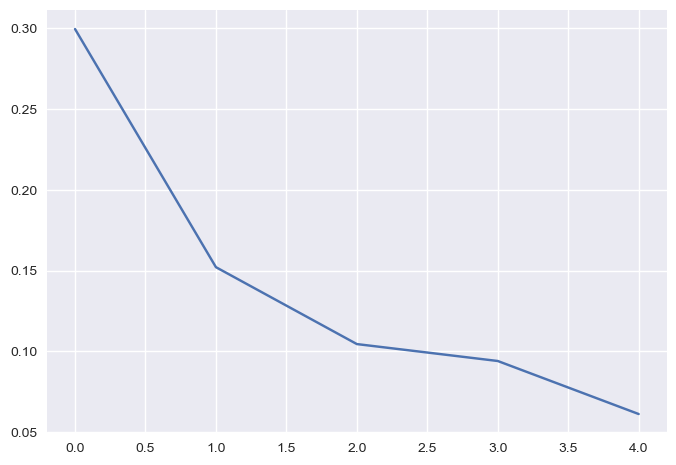

In [128]:
plt.plot(scf[0:5])

C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_27848\1830681396.py:7: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  ax[i].grid(b=True, linestyle ='--')


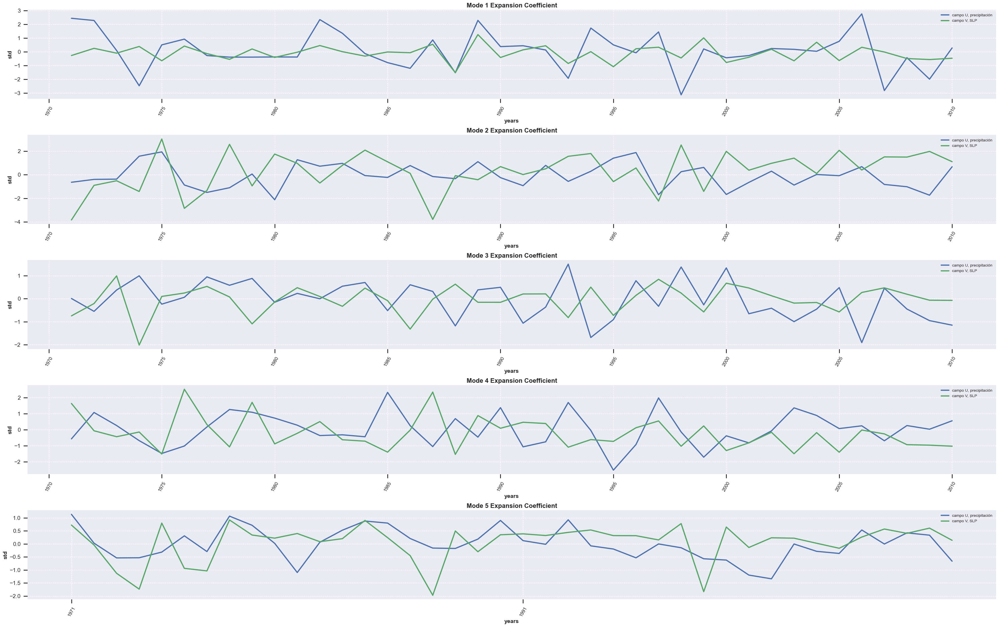

In [129]:
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(35,22)) 
# ax=fig.add_subplot(1, 1, 1)

for i in range(5):
    ax[i].plot(yrs,Us[i,:],  linewidth=3, label = 'campo U, precipitación')
    ax[i].plot(yrs, Vs[i,:], linewidth=3, label='campo V, SLP')
    ax[i].grid(b=True, linestyle ='--')
    plt.xticks(np.arange(yrs[0],yrs[-1],20))
    ax[i].tick_params('y',labelsize = 14, width = 2, length = 10)
    ax[i].tick_params('x',labelsize = 12, width = 2, length = 10, labelrotation = 60)
    ax[i].legend()
    ax[i].set_title(f'Mode {i+1} Expansion Coefficient', fontsize = 16, weight ='bold')
    ax[i].set_ylabel('std', fontsize = 14, fontweight = 'bold')
    ax[i].set_xlabel('years', fontsize = 14, fontweight = 'bold')
plt.tight_layout()

0.29961985


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


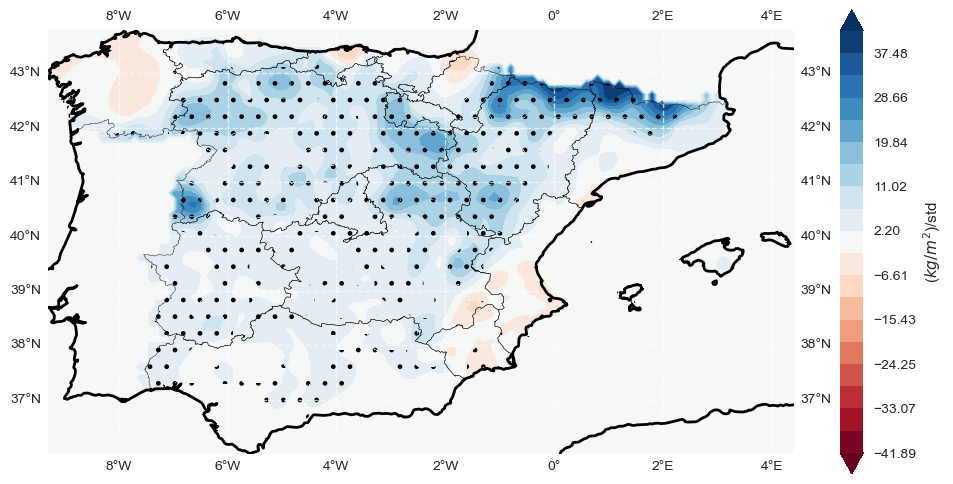

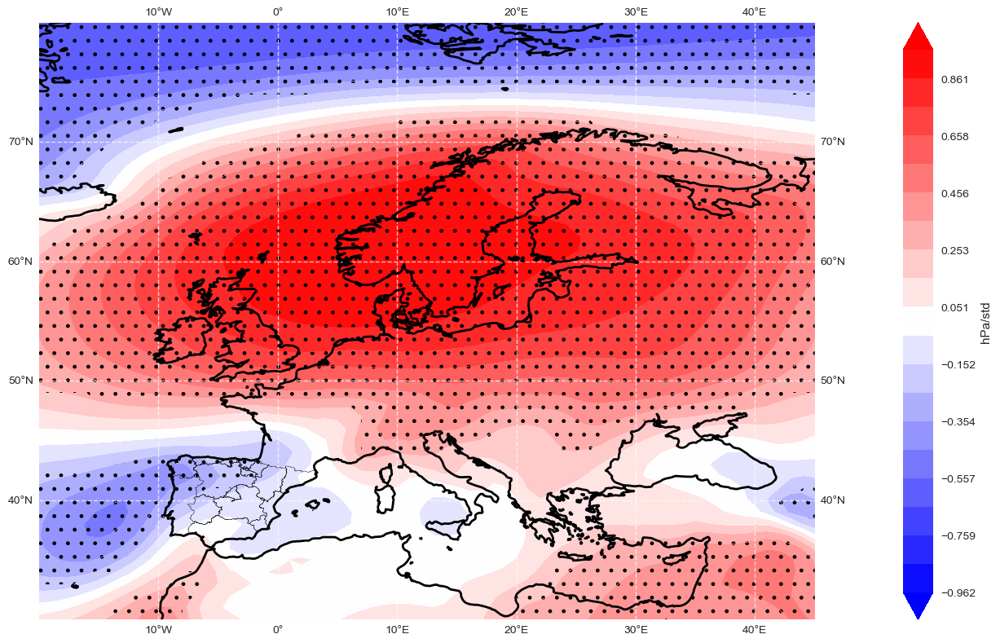

In [136]:
modo = 0
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])
fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,precip_julio.lon,precip_julio.lat,np.linspace(-maximo,+maximo,20), 'RdBu', '($kg/m^2$)/std','Modo 1 precipitación')
plt.tight_layout()
plt.savefig('Modo 1 precipitacion con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 11 precipitacion con SLP.png')

0.15212855


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


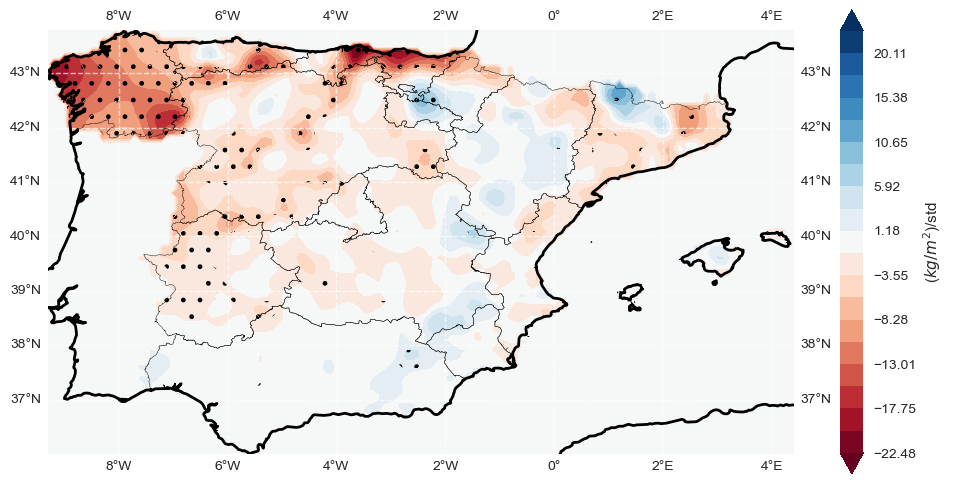

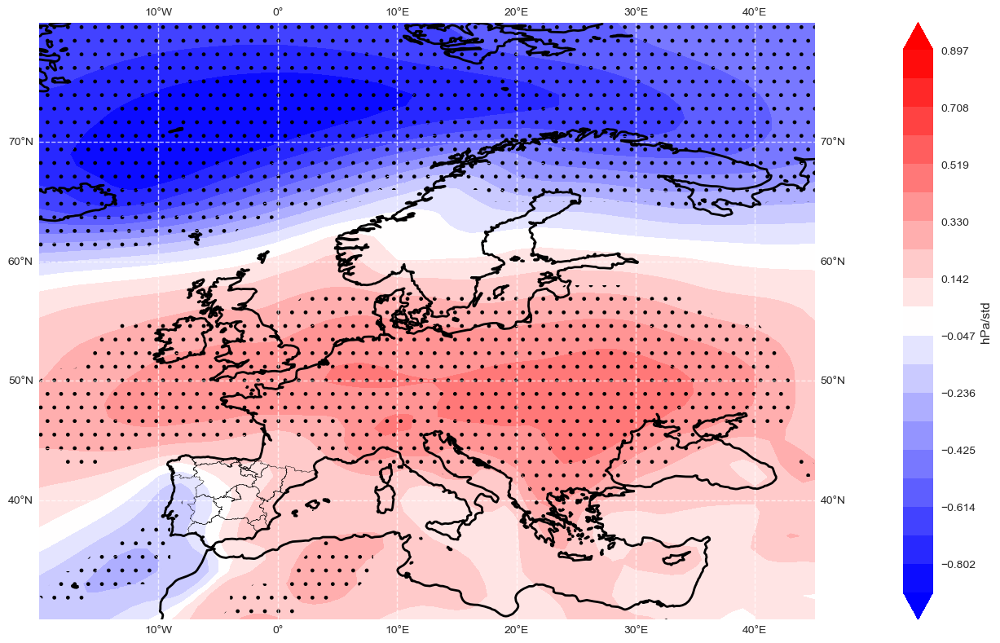

In [137]:
modo = 1
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,precip_julio.lon,precip_julio.lat,np.linspace(-maximo,+maximo,20), 'RdBu', '($kg/m^2$)/std','Modo 2 precipitación')
plt.tight_layout()
plt.savefig('Modo 2 precipitacion con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 22 precipitacion con SLP.png')

0.10450527


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


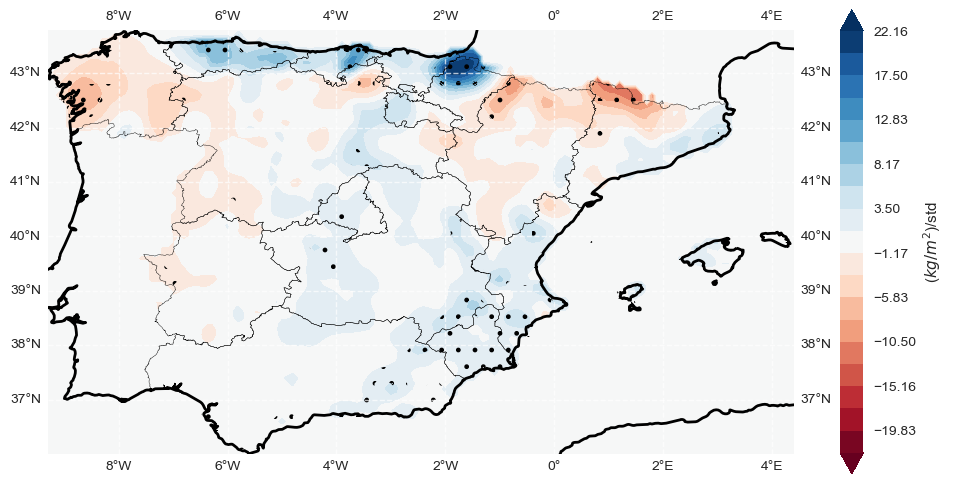

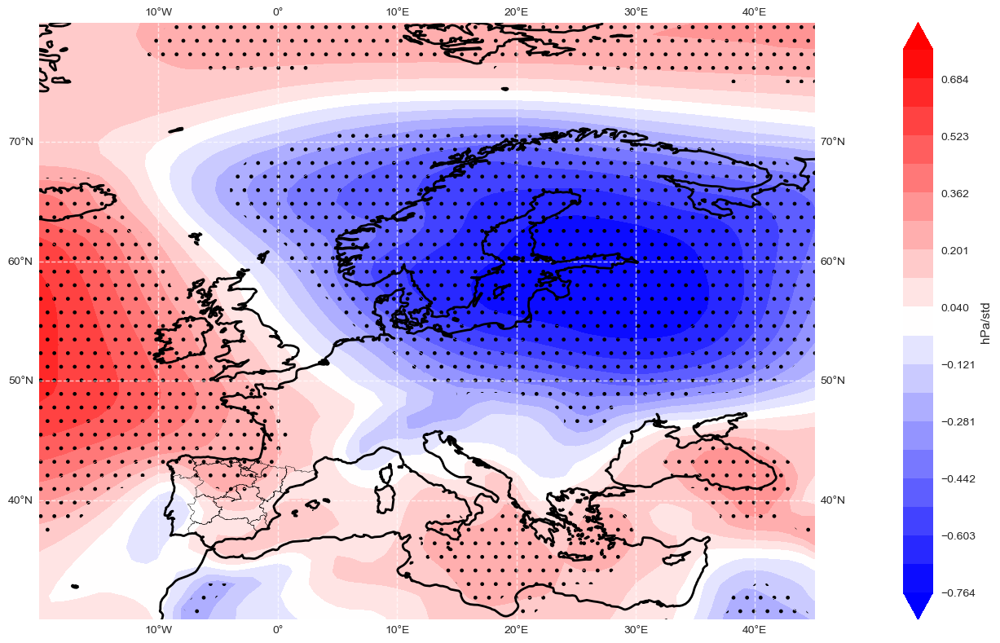

In [138]:
modo = 2
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,precip_julio.lon,precip_julio.lat,np.linspace(-maximo,+maximo,20), 'RdBu', '($kg/m^2$)/std','Modo 3 precpitación')
plt.tight_layout()
plt.savefig('Modo 3 precipitacion con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 33 precipitacion con SLP.png')

0.09402486


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


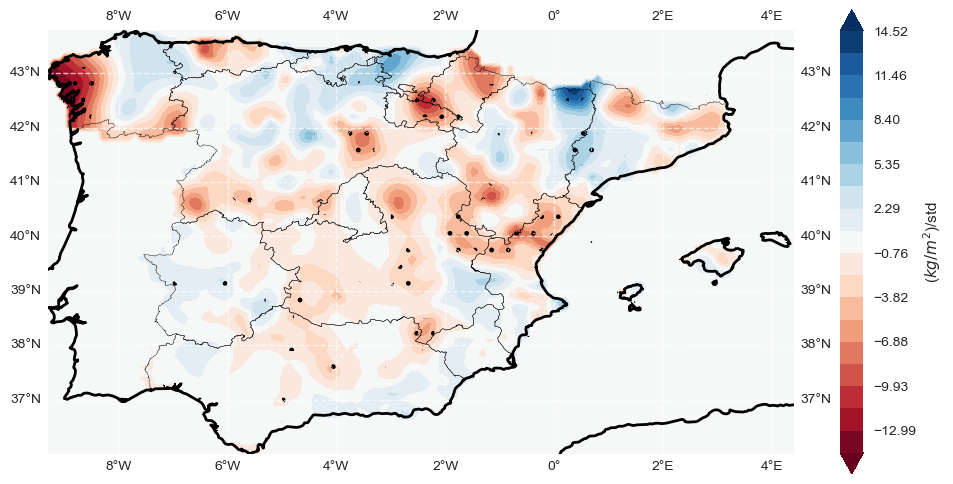

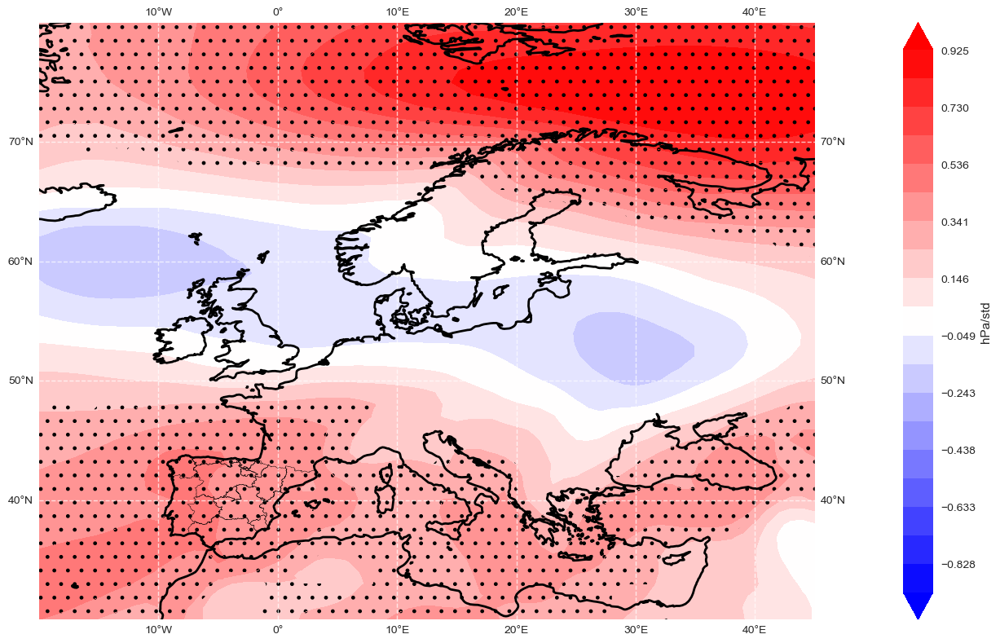

In [139]:
modo = 3
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,precip_julio.lon,precip_julio.lat,np.linspace(-maximo,+maximo,20), 'RdBu', '($kg/m^2$)/std','Modo 4 precpitación')
plt.tight_layout()
plt.savefig('Modo 4 precipitacion con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 44 precipitacion con SLP.png')

0.06118014


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'alfa'
  result = super().contourf(*args, **kwargs)


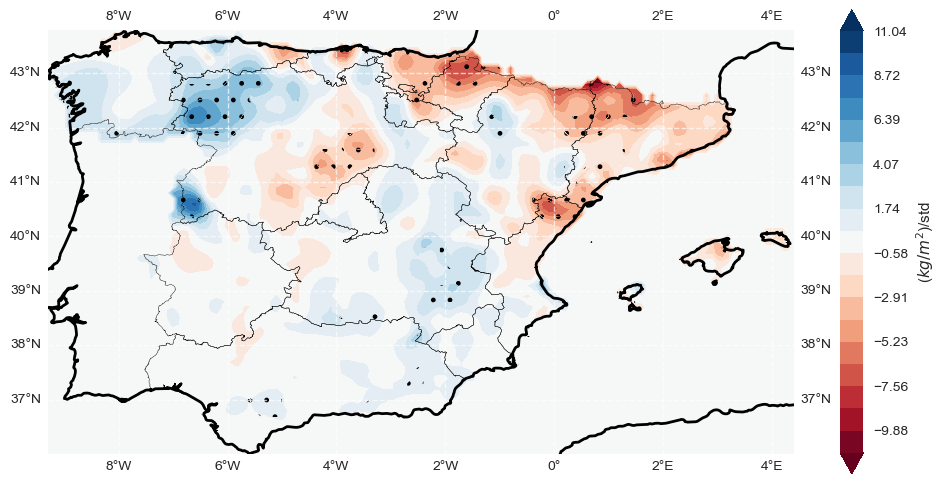

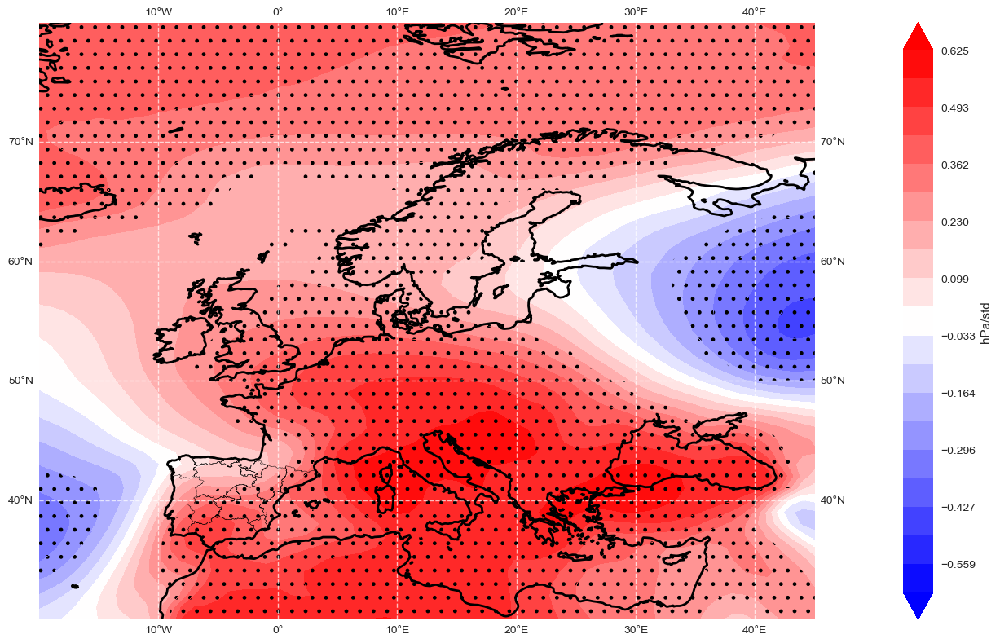

In [140]:
modo = 4
var1= SUZ[:,modo]
var1= pongonans(var1,z_antes)
var1_sig= SUZ_sig[:,modo]
var1_sig= pongonans(var1_sig,np.ma.array(z_antes,mask=False))
print(scf[modo])

fig = plt.figure(figsize=(10,5)) 
maximo= np.max((abs(np.nanmin(var1)),abs(np.nanmax(var1))))
dibujo_2_mapas_cartopy_hatches(var1,var1_sig,precip_julio.lon,precip_julio.lat,np.linspace(-maximo,+maximo,20), 'RdBu', '($kg/m^2$)/std','Modo 4 precpitación')
plt.tight_layout()
plt.savefig('Modo 5 precipitacion con SLP.png')
fig = plt.figure(figsize=(22,8)) 
maximo= np.max((abs(np.nanmin(RUY[:,modo])),abs(np.nanmax(RUY[:,modo]))))
dibujo_2_mapas_cartopy_hatches(RUY[:,modo], RUY_sig[:,modo], anom_era_slp_julio.longitude, anom_era_slp_julio.latitude, np.linspace(-maximo,+maximo,20), 'bwr', 'hPa/std', 'mapa heterogéneo')
plt.tight_layout()
plt.savefig('Modo 55 precipitacion con SLP.png')